# 설치파일

In [5]:
pip install pandas

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 11.3 MB 471 kB/s eta 0:00:01
     |████████████████████████████████| 347 kB 355 kB/s eta 0:00:01
     |████████████████████████████████| 509 kB 421 kB/s eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install Matplotlib

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 7.8 MB 640 kB/s eta 0:00:01
     |████████████████████████████████| 64 kB 739 kB/s eta 0:00:01
     |████████████████████████████████| 3.0 MB 815 kB/s eta 0:00:01
     |████████████████████████████████| 111 kB 481 kB/s eta 0:00:01
     |████████████████████████████████| 249 kB 372 kB/s eta 0:00:01
     |████████████████████████████████| 2.7 MB 559 kB/s eta 0:00:01
     |████████████████████████████████| 5.3 MB 912 kB/s eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [20]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [65]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


# 데이터 전처리

#### 파일 다시 저장하기

In [1]:
import os
import pandas as pd
import chardet

In [2]:
current_dir = os.getcwd()
datasets_dir = os.path.join(current_dir, 'datasets')

dataframes_dict = {}

if os.path.exists(datasets_dir):  
    # .xls 확장자 파일 찾기
    xls_files = sorted([file for file in os.listdir(datasets_dir) if file.endswith('.xls')])
    
    if xls_files:
        print(f"Found files: {xls_files}")

        # 파일별 처리
        for file_name in xls_files:
            file_path = os.path.join(datasets_dir, file_name)
            print(f"Processing file: {file_path}")

            try:
                # 엑셀 파일 확장자지만 내용은 텍스트 파일인 경우, CSV로 처리
                df = pd.read_csv(file_path, encoding='euc-kr', delimiter='\t', engine='python')

                # 파일명에서 train_number 추출 (321 제외하고 뒤 두 자리)
                train_number = file_name.split('_')[0][3:5]

                # train_number 컬럼 추가
                df['train number'] = train_number

                # train_number를 첫 번째 컬럼으로 이동
                cols = ['train number'] + [col for col in df.columns if col != 'train number']
                df = df[cols]

                # train_number별로 데이터프레임 분리
                if train_number not in dataframes_dict:
                    dataframes_dict[train_number] = []
                
                dataframes_dict[train_number].append(df)

            except Exception as e:
                print(f"Error reading {file_name}: {e}")
else:
    print(f"Directory 'datasets' does not exist at {datasets_dir}")

# 각 train_number별 데이터프레임 병합
for train_number in dataframes_dict:
    dataframes_dict[train_number] = pd.concat(dataframes_dict[train_number], ignore_index=True)
    print(f"DataFrame for train number {train_number} created with shape: {dataframes_dict[train_number].shape}")


Found files: ['31208 운행 정보_01__20240801.xls', '31208 운행 정보_02__20240802.xls', '31208 운행 정보_03__20240803.xls', '31208 운행 정보_04__20240804.xls', '31208 운행 정보_05__20240805.xls', '31208 운행 정보_06__20240806.xls', '31208 운행 정보_07__20240807.xls', '31208 운행 정보_08__20240808.xls', '31208 운행 정보_09__20240809.xls', '31208 운행 정보_10__20240810.xls', '31208 운행 정보_11__20240811.xls', '31208 운행 정보_12__20240812.xls', '31208 운행 정보_13__20240813.xls', '31208 운행 정보_14__20240814.xls', '31208 운행 정보_15__20240815.xls', '31208 운행 정보_22_20240816_20240822.xls', '31208 운행 정보_23__20240823.xls', '31208 운행 정보_24__20240824.xls', '31208 운행 정보_25__20240825.xls', '31208 운행 정보_26__20240826.xls', '31208 운행 정보_27__20240827.xls', '31208 운행 정보_28__20240828.xls', '31208 운행 정보_29__20240829.xls', '31208 운행 정보_30__20240830.xls', '31208 운행 정보_31__20240831.xls', '31

KeyboardInterrupt: 

In [ ]:
dataframes_dict['09']

In [ ]:
dataframes_dict

In [ ]:
# 현재 작업 디렉토리 및 데이터 저장 경로 설정
current_dir = os.getcwd()
output_dir = os.path.join(current_dir, 'output')
os.makedirs(output_dir, exist_ok=True)

# 데이터프레임 딕셔너리가 존재하는지 확인하고 CSV로 저장
if 'dataframes_dict' in globals():
    for train_number, df in dataframes_dict.items():
        output_file = os.path.join(output_dir, f"train_{train_number}.csv")
        df.to_csv(output_file, index=False, encoding='utf-8-sig')
        print(f"DataFrame for train number {train_number} saved to {output_file} with shape: {df.shape}")
else:
    print("dataframes_dict is not defined. Ensure that the data processing script has run successfully.")


#### 호차별 데이터 불러오기

In [6]:
import os
import pandas as pd
import chardet

In [8]:
def preprocess_dataframe(df):
    columns_to_drop = [
    "000 HVAC SDR_T CAR 외부온도", "000 HVAC SDR_T CAR 온도 설정치 변동폭",
    "100 HVAC SDR_M CAR 외부온도", "100 HVAC SDR_M CAR 온도 설정치 변동폭",
    "200 HVAC SDR_T CAR 외부온도", "200 HVAC SDR_T CAR 온도 설정치 변동폭",
    "300 HVAC SDR_T CAR 외부온도", "300 HVAC SDR_T CAR 온도 설정치 변동폭",
    "400 HVAC SDR_T CAR 외부온도", "400 HVAC SDR_T CAR 온도 설정치 변동폭",
    "500 HVAC SDR_T CAR 외부온도", "500 HVAC SDR_T CAR 온도 설정치 변동폭",
    "600 HVAC SDR_T CAR 외부온도", "600 HVAC SDR_T CAR 온도 설정치 변동폭",
    "700 HVAC SDR_T CAR 외부온도", "700 HVAC SDR_T CAR 온도 설정치 변동폭",
    "800 HVAC SDR_T CAR 외부온도", "800 HVAC SDR_T CAR 온도 설정치 변동폭",
    "900 HVAC SDR_T CAR 외부온도", "900 HVAC SDR_T CAR 온도 설정치 변동폭", 
    "Unnamed: 177"
    ]

    df.drop(columns=columns_to_drop, inplace=True)
    
    default_dd_columns = [col for col in df.columns if "DEFAULT_DD" in col]

    new_columns = []    
    for i in range(0, len(default_dd_columns) // 2):
        new_columns.append(f"{str(i * 100).zfill(3)} door_left")
        new_columns.append(f"{str(i * 100).zfill(3)} door_right")

    column_mapping = dict(zip(default_dd_columns, new_columns))

    df.rename(columns=column_mapping, inplace=True)
    
    return df

In [9]:
# 민원데이터
complaint = pd.read_csv("./output/data.csv", encoding='EUC-KR')
#complaint

In [10]:
def filtering_complaint(trainnum, carnum1, carnum2):
    filtered_complaint = complaint[(complaint['CarNum'] >= carnum1) & 
              (complaint['CarNum'] <= carnum2) & 
              (complaint['CarNum'] % 100 == trainnum)].copy()
    
    filtered_complaint['발생시각'] = pd.to_datetime(filtered_complaint['접수일'].astype(str) + " " + filtered_complaint['접수시간'].astype(str))
    return filtered_complaint

In [20]:
312112 % 100

12

In [11]:
def complaint_match(df1, df2):
    df1['발생시각'] = pd.to_datetime(df1['발생시각'])
    #df2['발생시각'] = pd.to_datetime(df2['발생시각'])
    
    df1['complaint'] = 0
    df1.loc[df1['발생시각'].isin(df2['발생시각']), 'complaint'] = 1
    
    return df1

In [ ]:
import re
from datetime import datetime, timedelta
def process_dataframe(df, comp, output_name):
    merged = pd.merge(df, comp, on="발생시각", how="inner")
    merged

    pattern = r"^(000|100|200|300|400|500|600|700|800|900) "
    common_columns = [col for col in df.columns if not re.match(pattern, col)]
    common_columns

    merged["접두사"] = merged["CarNum"].apply(lambda x: f"{str(x)[3]}00")
    merged["접두사"] # 400, 500, 100, ... 

    def filter_columns(prefix, columns):
        filtered_columns = [col for col in columns if col.startswith(prefix + " ")]
        return [col.replace(f"{prefix} ", "") for col in filtered_columns]

    # 최종 컬럼 선택 및 데이터 프레임 생성
    complaint_data = pd.DataFrame()

    # complaint == 1인 데이터만 먼저 필터링
    for _, row in merged.iterrows():
        prefix = row["접두사"]
        
        row_data = row[common_columns].to_dict()
        
        prefixed_columns = filter_columns(prefix, df.columns)
        for col in prefixed_columns:
            original_col = f"{prefix} {col}"
            if original_col in row:
                row_data[col] = row[original_col]
        
        row_data["실외온도1"] = row["000 HVAC SD_실외온도 값"]
        row_data["실외온도2"] = row["900 HVAC SD_실외온도 값"]
    
        complaint_data = pd.concat([complaint_data, pd.DataFrame([row_data])], ignore_index=True)
        
        complaint_data.to_csv('test.csv', index=False, encoding='utf-8-sig')

         ############## 위에 코드 문제 없이 실행
    # 여기서 부터 전 후 데이터 붙이는 코드 구현하면 된다.
    
    
    
    '''
        start_time = row["발생시각"] - timedelta(minutes=5)
        end_time = row["발생시각"] + timedelta(minutes=5)
        
        # 발생시각 전후 5분 데이터 필터링
        time_filtered = df[(df["발생시각"] > start_time) & (df["발생시각"] < end_time)]
        
        for _, tf_row in time_filtered.iterrows():
            tf_row_data = tf_row[common_columns].to_dict()
            
            for col in prefixed_columns:
                original_col = f"{prefix} {col}"
                if original_col in tf_row:
                    tf_row_data[col] = tf_row[original_col]
            
            tf_row_data["실외온도1"] = tf_row["000 HVAC SD_실외온도 값"]
            tf_row_data["실외온도2"] = tf_row["900 HVAC SD_실외온도 값"]
            
            final_data = pd.concat([final_data, pd.DataFrame([tf_row_data])], ignore_index=True)

    final_data.drop_duplicates(inplace=True)
    final_data.sort_values(by="발생시각", inplace=True)

    final_data.to_csv(output_name, index=False, encoding='utf-8-sig')

    print(f"CSV 파일이 저장되었습니다: {output_name}")
    '''

'\n        start_time = row["발생시각"] - timedelta(minutes=5)\n        end_time = row["발생시각"] + timedelta(minutes=5)\n        \n        # 발생시각 전후 5분 데이터 필터링\n        time_filtered = df[(df["발생시각"] > start_time) & (df["발생시각"] < end_time)]\n        \n        for _, tf_row in time_filtered.iterrows():\n            tf_row_data = tf_row[common_columns].to_dict()\n            \n            for col in prefixed_columns:\n                original_col = f"{prefix} {col}"\n                if original_col in tf_row:\n                    tf_row_data[col] = tf_row[original_col]\n            \n            tf_row_data["실외온도1"] = tf_row["000 HVAC SD_실외온도 값"]\n            tf_row_data["실외온도2"] = tf_row["900 HVAC SD_실외온도 값"]\n            \n            final_data = pd.concat([final_data, pd.DataFrame([tf_row_data])], ignore_index=True)\n\n    final_data.drop_duplicates(inplace=True)\n    final_data.sort_values(by="발생시각", inplace=True)\n\n    final_data.to_csv(output_name, index=False, encoding=\'utf-8-sig\')\

In [143]:
dfs = []

for i in range(8, 9):
    file_path = f"./output/train_{i:02}.csv" 
    try:
        df = pd.read_csv(file_path, encoding='utf-8-sig')
        dfs.append(df)  
        print(f"{file_path} 불러오기 성공, 데이터 크기: {df.shape}")
    except Exception as e:
        print(f"{file_path} 불러오기 실패: {e}")

print(f"총 {len(dfs)}개의 데이터프레임이 로드되었습니다.")

./output/train_08.csv 불러오기 성공, 데이터 크기: (1851420, 179)
총 1개의 데이터프레임이 로드되었습니다.


In [144]:
import re
df_op = {}
df_comp = {}
hocha_i = 8

for i, data in enumerate(dfs):
    car_index = i + hocha_i
    output_path = f"./output/df{car_index}_final.csv" 
    
    carnum1 = 312000 + car_index  # 312008, 312008
    carnum2 = carnum1 + 900  # 312908, 312908
    
    df_op[i] = preprocess_dataframe(data)
    df_comp[i] = filtering_complaint(car_index, carnum1, carnum2)
    df_op[i] = complaint_match(df_op[i], df_comp[i])
    
    process_dataframe(df_op[i], df_comp[i], output_path)
    #print(f"{car_index}호차 데이터 저장 완료: {output_path}")

In [130]:
tf_row_data

{'train number': 8,
 '발생시각': Timestamp('2024-08-31 23:37:11'),
 'DEFAULT_HCR': 0,
 'DEFAULT_TCR': 1,
 'DEFAULT_현재역': 21,
 'DEFAULT_다음역': 20,
 'DEFAULT_종착역': 11,
 'DEFAULT_신호장치 속도': 46,
 'complaint': 0,
 'door_left': 0,
 'door_right': 0,
 'HVAC SDR_T CAR 자동 AUTO': 0,
 'HVAC SD_전냉 CFULL': 0,
 'HVAC SD_반냉 CHALF': 0,
 'HVAC SD_FAN': 0,
 'HVAC SD_OFF': 0,
 'HVAC SD_환기동작 VENT': 0,
 'HVAC SD_LF FAN 동작상태 LFF': 1,
 'HVAC SD_실외온도 값': 0,
 'HVAC SD_실내온도 값': 23,
 'HVAC SD_CO2 센서 값': 1111,
 'HVAC SD_설정온도 값 HIGH': 26.0,
 'BECU SD_AS1 압력': 2.6,
 'BECU SD_AS2 압력': 2.56}

In [ ]:
for col in prefixed_columns:
    original_col = f"{prefix} {col}"
    #print(original_col)
    if original_col in row:
        row_data[col] = row[original_col]
        #print(row_data[col])

100 door_left
0
100 door_right
0
100 HVAC SDR_T CAR 자동 AUTO
0
100 HVAC SD_전냉 CFULL
0
100 HVAC SD_반냉 CHALF
0
100 HVAC SD_FAN
1
100 HVAC SD_OFF
0
100 HVAC SD_환기동작 VENT
1
100 HVAC SD_LF FAN 동작상태 LFF
1
100 HVAC SD_실외온도 값
0
100 HVAC SD_실내온도 값
22
100 HVAC SD_CO2 센서 값
987
100 HVAC SD_설정온도 값 HIGH
25.75
100 BECU SD_AS1 압력
2.76
100 BECU SD_AS2 압력
2.52


In [ ]:
#process_dataframe(df08, filtered_complaint, "./output/df08_final.csv")
# df_op[0][df_op[0]['complaint'] == 1].head(30)

,train number,발생시각,DEFAULT_HCR,DEFAULT_TCR,DEFAULT_현재역,DEFAULT_다음역,DEFAULT_종착역,DEFAULT_신호장치 속도,000 door_left,000 door_right,...,500 BECU SD_AS2 압력,600 BECU SD_AS1 압력,600 BECU SD_AS2 압력,700 BECU SD_AS1 압력,700 BECU SD_AS2 압력,800 BECU SD_AS1 압력,800 BECU SD_AS2 압력,900 BECU SD_AS1 압력,900 BECU SD_AS2 압력,complaint
45531,8,2024-08-01 17:56:22,0,1,97,161,85,79,0,0,...,2.52,2.36,2.12,2.56,2.84,2.96,3.16,3.16,2.92,1
47390,8,2024-08-01 18:27:22,1,0,85,86,69,47,0,0,...,2.48,2.32,2.20,2.64,2.88,3.28,3.28,3.36,3.08,1
48237,8,2024-08-01 18:41:29,1,0,95,96,69,5,0,0,...,3.52,3.16,3.08,3.12,3.60,3.56,3.68,3.76,3.72,1
54668,8,2024-08-01 20:28:42,1,0,95,96,69,0,0,0,...,3.04,2.68,2.64,2.64,3.00,3.24,3.40,3.44,3.24,1
127476,8,2024-08-02 16:42:31,1,0,96,161,69,46,0,0,...,2.36,2.08,2.04,2.32,2.52,2.92,2.84,3.20,2.96,1
133426,8,2024-08-02 18:21:43,1,0,86,87,92,25,0,0,...,2.80,2.36,2.36,2.44,2.76,2.88,3.36,3.52,2.88,1
134379,8,2024-08-02 18:37:36,1,0,96,161,92,29,0,0,...,3.40,2.96,2.80,3.20,3.20,3.48,3.52,3.40,3.36,1
134393,8,2024-08-02 18:37:50,1,0,96,161,92,8,0,0,...,3.28,2.96,2.76,3.20,3.16,3.48,3.52,3.40,3.48,1
134452,8,2024-08-02 18:38:49,1,0,161,97,92,58,0,0,...,3.32,2.88,2.72,3.16,3.24,3.32,3.68,3.56,3.44,1
202158,8,2024-08-03 13:27:34,1,0,156,155,51,84,0,0,...,2.60,2.20,2.08,2.44,2.72,3.04,3.20,3.24,2.88,1


In [21]:
from pathlib import Path

directory = Path("output")
combined_df = pd.concat(
    [pd.read_csv(file, encoding='utf-8', low_memory=False) for file in sorted(directory.glob("*_final.csv"))],
    ignore_index=True
)
# sort
combined_df['발생시각'] = pd.to_datetime(combined_df['발생시각'], errors='coerce')
combined_df = combined_df.sort_values(['train number', '발생시각']).reset_index(drop=True)


print(f"병합된 데이터프레임 (총 행: {len(combined_df)}, 총 열: {len(combined_df.columns)})")
print(combined_df.head())

output_file = "operation with complaint.csv"
combined_df.to_csv(output_file, index=False, encoding='utf-8-sig')

병합된 데이터프레임 (총 행: 334081, 총 열: 26)
   train number                발생시각  DEFAULT_HCR  DEFAULT_TCR  DEFAULT_현재역  \
0             8 2024-08-01 17:51:22            0            1           98   
1             8 2024-08-01 17:51:23            0            1           98   
2             8 2024-08-01 17:51:24            0            1           98   
3             8 2024-08-01 17:51:25            0            1           98   
4             8 2024-08-01 17:51:26            0            1           98   

   DEFAULT_다음역  DEFAULT_종착역  DEFAULT_신호장치 속도  complaint  door_left  ...  \
0           97           85               64          0          0  ...   
1           97           85               66          0          0  ...   
2           97           85               67          0          0  ...   
3           97           85               69          0          0  ...   
4           97           85               70          0          0  ...   

   HVAC SD_환기동작 VENT  HVAC SD_LF FAN 동작상태 LFF 

# ERA

In [ ]:
df = pd.read_csv("filtered_dataframe.csv", encoding="utf-8-sig")

In [ ]:
df

,train number,발생시각,HCR,TCR,현재역,다음역,종착역,신호장치 속도,호차,Left Door,...,실내온도 값,CO2 센서 값,설정온도 값 HIGH,AS1 압력,AS2 압력,HVAC SDR_T CAR 외부온도,HVAC SDR_T CAR 온도 설정치 변동폭,HVAC SDR_M CAR 외부온도,HVAC SDR_M CAR 온도 설정치 변동폭,hour
0,8,2024-07-28 09:18:08,1,0,162,69,69,80,1,0,...,23,1500,24.50,3.32,2.64,33.0,0.0,NaN,NaN,9
1,8,2024-07-28 09:18:09,1,0,162,69,69,81,1,0,...,23,1501,24.50,3.44,2.68,33.0,0.0,NaN,NaN,9
2,8,2024-07-28 09:18:10,1,0,162,69,69,81,1,0,...,23,1501,24.50,3.52,2.68,33.0,0.0,NaN,NaN,9
3,8,2024-07-28 09:18:11,1,0,162,69,69,81,1,0,...,23,1502,24.50,3.44,2.64,33.0,0.0,NaN,NaN,9
4,8,2024-07-28 09:18:12,1,0,162,69,69,81,1,0,...,23,1502,24.50,3.44,2.64,33.0,0.0,NaN,NaN,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8445355,15,2024-08-17 22:54:20,0,1,33,94,94,18,10,0,...,21,670,25.25,3.12,2.84,32.0,0.0,NaN,NaN,22
8445356,15,2024-08-17 22:54:21,0,1,33,94,94,17,10,0,...,21,672,25.25,3.12,2.80,32.0,0.0,NaN,NaN,22
8445357,15,2024-08-17 22:54:22,0,1,33,94,94,17,10,0,...,21,672,25.25,3.12,2.84,32.0,0.0,NaN,NaN,22
8445358,15,2024-08-17 22:54:23,0,1,33,94,94,17,10,0,...,21,672,25.25,3.08,2.76,32.0,0.0,NaN,NaN,22


In [ ]:
def cal_thermal_comfort(T_int, T_ext, Co2, density, airflow):
    f_temp = 1 - ((abs(T_int - T_ext))/10)
    f_co2 = 1 - (Co2-1000) / 1000
    f_density = 1 - (density-3) / 10000
    f_air = 0.5 if airflow == 0 else airflow / 2
    
    thermal_comfort = f_temp * f_co2 * f_density * f_air
    
    print(f_temp)
    return thermal_comfort

In [ ]:
df.dtypes

train number                   int64
발생시각                          object
HCR                            int64
TCR                            int64
현재역                            int64
다음역                            int64
종착역                            int64
신호장치 속도                        int64
호차                             int64
Left Door                      int64
Right Door                     int64
AUTO                           int64
전냉 CFULL                       int64
반냉 CHALF                       int64
FAN                            int64
OFF                            int64
환기동작 VENT                      int64
LF FAN 동작상태 LFF                int64
실외온도 값                         int64
실내온도 값                         int64
CO2 센서 값                       int64
설정온도 값 HIGH                  float64
AS1 압력                       float64
AS2 압력                       float64
HVAC SDR_T CAR 외부온도          float64
HVAC SDR_T CAR 온도 설정치 변동폭    float64
HVAC SDR_M CAR 외부온도          float64
H

In [ ]:
opdata['comport'] = opdata.apply(
    lambda row: cal_thermal_comfort(row['실내온도 값'], row['실외온도 값'], row['CO2 센서 값'], 0.5 , row['FAN']), axis=1
)

0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5


In [ ]:
opdata

,train number,발생시각,HCR,TCR,현재역,다음역,종착역,신호장치 속도,호차,Left Door,...,환기동작 VENT,LF FAN 동작상태 LFF,실외온도 값,실내온도 값,CO2 센서 값,설정온도 값 HIGH,AS1 압력,AS2 압력,hour,comport
3691,08,2024-08-12 05:07:51,1,0,2,3,51,0,1,0,...,0,0,30,25,662,23.75,3.40,2.64,5,0.334584
3692,08,2024-08-12 05:07:52,1,0,2,3,51,0,1,0,...,0,0,30,25,662,23.75,3.40,2.64,5,0.334584
3693,08,2024-08-12 05:07:53,1,0,2,3,51,0,1,0,...,0,0,30,25,662,23.75,3.40,2.64,5,0.334584
3694,08,2024-08-12 05:07:54,1,0,2,3,51,0,1,0,...,0,0,30,25,662,23.75,3.40,2.64,5,0.334584
3695,08,2024-08-12 05:07:55,1,0,2,3,51,0,1,0,...,0,0,30,25,662,23.75,3.40,2.64,5,0.334584
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
714816,08,2024-08-12 23:51:03,1,0,50,51,51,0,10,0,...,0,0,35,21,603,22.50,3.20,2.88,23,-0.279470
714817,08,2024-08-12 23:51:04,1,0,50,51,51,0,10,0,...,0,0,35,21,603,22.50,3.24,2.88,23,-0.279470
714818,08,2024-08-12 23:51:05,1,0,50,51,51,0,10,0,...,0,0,35,21,602,22.50,3.24,2.88,23,-0.279670
714819,08,2024-08-12 23:51:06,1,0,50,51,51,0,10,0,...,0,0,35,21,602,22.50,3.24,2.88,23,-0.279670


In [ ]:
opdata[opdata['comport'] >= 0.5]

,train number,발생시각,HCR,TCR,현재역,다음역,종착역,신호장치 속도,호차,Left Door,...,환기동작 VENT,LF FAN 동작상태 LFF,실외온도 값,실내온도 값,CO2 센서 값,설정온도 값 HIGH,AS1 압력,AS2 압력,hour,comport
85459,08,2024-08-12 07:58:40,0,1,34,33,104,0,2,1,...,1,1,0,22,2834,26.25,3.68,3.64,7,0.500525
85460,08,2024-08-12 07:58:41,0,1,34,33,104,0,2,1,...,1,1,0,22,2834,26.25,3.68,3.64,7,0.500525
85461,08,2024-08-12 07:58:42,0,1,34,33,104,0,2,1,...,1,1,0,22,2852,26.25,3.72,3.64,7,0.511328
85462,08,2024-08-12 07:58:43,0,1,34,33,104,0,2,1,...,1,1,0,22,2852,26.25,3.72,3.64,7,0.511328
85463,08,2024-08-12 07:58:44,0,1,34,33,104,0,2,1,...,1,1,0,22,2852,26.25,3.72,3.64,7,0.511328
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631183,08,2024-08-12 20:29:13,0,1,3,2,166,0,9,0,...,1,1,0,23,2862,20.75,3.60,3.72,20,0.560440
631184,08,2024-08-12 20:29:14,0,1,3,2,166,2,9,0,...,1,1,0,23,2862,20.75,3.60,3.72,20,0.560440
631185,08,2024-08-12 20:29:15,0,1,3,2,166,6,9,0,...,1,1,0,23,2838,21.00,3.64,3.68,20,0.544836
631186,08,2024-08-12 20:29:16,0,1,3,2,166,10,9,0,...,1,1,0,23,2771,21.00,3.60,3.68,20,0.501275


In [ ]:
# 호차별 데이터 집계
result = df.groupby(['호차', 'hour']).agg({
    '실내온도 값': 'mean',
    '실외온도 값' : 'mean',
    'AUTO': 'sum',
    '전냉 CFULL': 'sum',
    '반냉 CHALF': 'sum',
    'FAN': 'sum',
    'OFF': 'sum', 
    '환기동작 VENT':'sum',
    'LF FAN 동작상태 LFF':'sum'
}).reset_index()
result

,호차,hour,실내온도 값,실외온도 값,AUTO,전냉 CFULL,반냉 CHALF,FAN,OFF,환기동작 VENT,LF FAN 동작상태 LFF
0,1,5,22.916434,28.363326,6921,0,19412,5501,1014,6398,8115
1,1,6,22.121463,29.398191,5866,859,29382,4913,1127,5453,4834
2,1,7,21.931759,29.998059,3478,7332,25192,8105,994,8700,10061
3,1,8,22.276058,30.954879,1956,10930,22565,13090,1192,13917,19157
4,1,9,22.417944,31.693922,0,5823,31173,7508,661,8017,21394
...,...,...,...,...,...,...,...,...,...,...,...
185,10,19,21.586625,33.706904,2750,13193,30446,3481,3251,3853,34540
186,10,20,21.648590,32.517494,2446,5302,35744,4285,3241,4802,27960
187,10,21,21.415506,31.625315,1005,1880,37802,2530,2390,2970,23021
188,10,22,21.128311,31.616942,4158,4510,33387,2831,4034,3048,20677


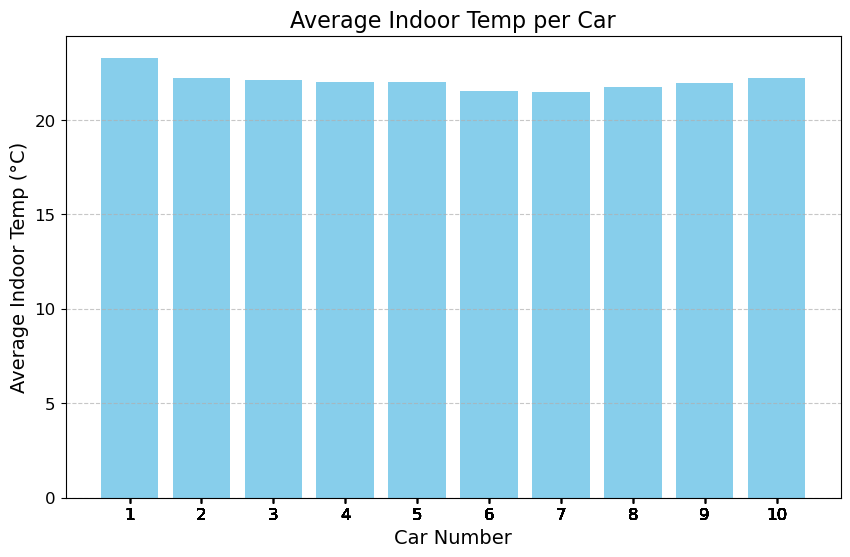

In [ ]:
import matplotlib.pyplot as plt
# 그래프 생성
plt.figure(figsize=(10, 6))
plt.bar(result['호차'], result['실내온도 값'], color='skyblue')

# 그래프 꾸미기
plt.title('Average Indoor Temp per Car', fontsize=16)
plt.xlabel('Car Number', fontsize=14)
plt.ylabel('Average Indoor Temp (°C)', fontsize=14)
plt.xticks(result['호차'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 출력
plt.show()

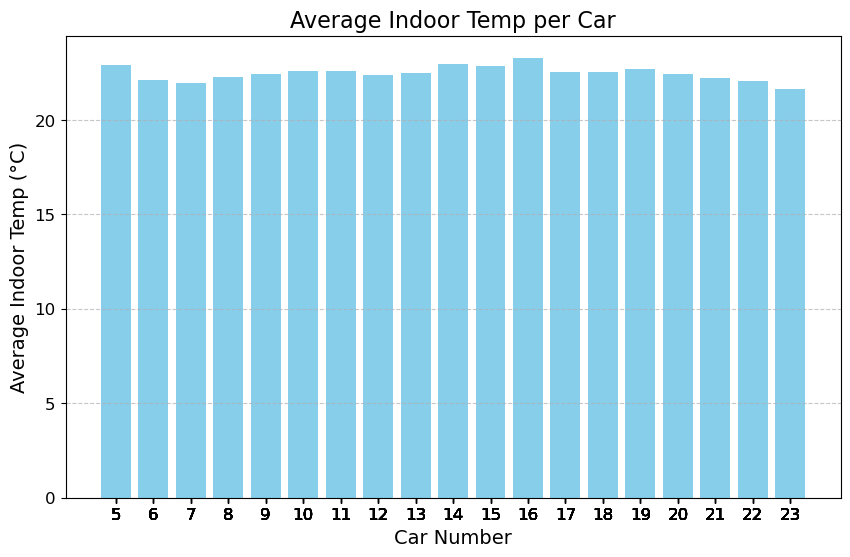

In [ ]:
import matplotlib.pyplot as plt
# 그래프 생성
plt.figure(figsize=(10, 6))
plt.bar(result['hour'], result['실내온도 값'], color='skyblue')

# 그래프 꾸미기
plt.title('Average Indoor Temp per Car', fontsize=16)
plt.xlabel('Car Number', fontsize=14)
plt.ylabel('Average Indoor Temp (°C)', fontsize=14)
plt.xticks(result['hour'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 출력
plt.show()

# 민원데이터 처리

In [2]:
import pandas as pd
import os
import chardet

In [3]:
# 폴더 경로 설정
current_dir = os.getcwd()
folder_path = os.path.join(current_dir, 'datasets/Downloads')

# 폴더 내 모든 CSV 파일 리스트 가져오기
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# 파일 이름 순서대로 정렬
csv_files.sort()

# 각 CSV 파일을 읽어서 리스트에 저장
dataframes = []
for file in csv_files:
    file_path = os.path.join(folder_path, file)
    
    # 파일의 인코딩 감지
    with open(file_path, 'rb') as f:
        result = chardet.detect(f.read())
    encoding = result['encoding']

    try:
        # 감지된 인코딩으로 파일 읽기
        df = pd.read_csv(file_path, encoding=encoding)
        print(f"{file} 파일을 {encoding} 인코딩으로 성공적으로 읽었습니다.")
    except UnicodeDecodeError:
        print(f"파일 {file}을(를) 읽을 수 없습니다.")
        continue

    dataframes.append(df)

# 리스트의 데이터프레임을 하나로 합침
final_dataframe = pd.concat(dataframes, ignore_index=True)

# 결과 확인
#print(final_dataframe)

20240801.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240802.csv 파일을 CP949 인코딩으로 성공적으로 읽었습니다.
20240803.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240804.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240805.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240806.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240807.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240808.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240809.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240810.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240811.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240812.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240813.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240814.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240815.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240816.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240817.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240818.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240819.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240820.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240821.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240822.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240823.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
20240824.csv

In [ ]:
final_dataframe

,접수일,접수시간,민원인번호,문자내용,상태,자동회신,키워드회신,자동회신내용,키워드회신내용,답변내용1,답변내용2,답변내용3,답변내용4,답변내용5
0,2024-08-01,23:59:52,2142fa0d,312432(1) 서동탄행 에어컨 온도좀 내려주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
1,2024-08-01,23:59:05,d6fc6d32,사람도 엄청 많은데 에어컨좀 빵빵하게 틀어주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
2,2024-08-01,23:58:35,d6fc6d32,1호선 311577칸인데 너무 더워요 에어컨 켜주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
3,2024-08-01,23:50:55,bf1e339f,분당선 351049 1호차 에어컨 온도가 너무 낮아서 올려주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
4,2024-08-01,23:50:36,5fb57fed,"왜 안시원해져요,,,, 여기 다들 부채질하고 난린데,,,,",처리생략,미회신,미회신,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92714,2024-08-31,00:09:47,26acfb3b,331022\n너무.. 심각하게\n덥습니다,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
92715,2024-08-31,00:04:08,f7551cae,2313호 현재 영종으로 향하고 있는 열차인데 너무 덥습니다ㅠㅠ 에어컨 부탁드려요,처리완료,미회신,회신,NaN,"고객님, 공항철도는 공항철도 운영사 1599-7788(전화)로 문의하여 주시기 바랍니다.",NaN,NaN,NaN,NaN,NaN
92716,2024-08-31,00:03:00,380e5707,[서울교통공사] \n★ 접수일시 : 2024-08-30 23:57:15\n★ 고객번...,처리완료,미회신,회신,NaN,NaN,NaN,NaN,NaN,NaN,NaN
92717,2024-08-31,00:00:54,55517aea,진짜 공공장소법정 실내온도 좀 지키자!!!!!!,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN


In [ ]:
pattern = r"(?=.*(덥|더|에어))(?=.*\d{6})"
filtered_df = final_dataframe[final_dataframe['문자내용'].str.contains(pattern, case=False, na=False, regex=True)]
filtered_df

/var/folders/zb/pvqh3b7s2jn_79b2993zx3n00000gn/T/ipykernel_1424/3138642576.py:2: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtered_df = final_dataframe[final_dataframe['문자내용'].str.contains(pattern, case=False, na=False, regex=True)]


,접수일,접수시간,민원인번호,문자내용,상태,자동회신,키워드회신,자동회신내용,키워드회신내용,답변내용1,답변내용2,답변내용3,답변내용4,답변내용5
0,2024-08-01,23:59:52,2142fa0d,312432(1) 서동탄행 에어컨 온도좀 내려주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
2,2024-08-01,23:58:35,d6fc6d32,1호선 311577칸인데 너무 더워요 에어컨 켜주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
3,2024-08-01,23:50:55,bf1e339f,분당선 351049 1호차 에어컨 온도가 너무 낮아서 올려주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
8,2024-08-01,23:43:41,afecf22c,경의중앙 321603 행신 많이 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
9,2024-08-01,23:42:13,5fb57fed,"인천방면 3-2 312409 2번칸입니다 너무 더워요,,,,,",처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92697,2024-08-31,05:46:37,4b6d9c5a,용산급행열차 312633 너무 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
92703,2024-08-31,05:38:50,9c5c49eb,1호선 인천행 312445 1번칸 에어컨 틀어주세요 뺘르게 부탁드리겠습니다,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
92704,2024-08-31,05:38:34,9c5c49eb,1호선 인천행 312445 1번칸 에어컨 틀어주세요 아직은 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
92706,2024-08-31,05:21:44,600e0e31,1호선 312047호 1번칸 더워요;;;;;,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN


In [ ]:
pattern = r"낮춰|추워|춥"
filtered_df = filtered_df[~filtered_df['문자내용'].str.contains(pattern, case=False, na=False, regex=True)]
filtered_df

,접수일,접수시간,민원인번호,문자내용,상태,자동회신,키워드회신,자동회신내용,키워드회신내용,답변내용1,답변내용2,답변내용3,답변내용4,답변내용5
0,2024-08-01,23:59:52,2142fa0d,312432(1) 서동탄행 에어컨 온도좀 내려주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
2,2024-08-01,23:58:35,d6fc6d32,1호선 311577칸인데 너무 더워요 에어컨 켜주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
3,2024-08-01,23:50:55,bf1e339f,분당선 351049 1호차 에어컨 온도가 너무 낮아서 올려주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
8,2024-08-01,23:43:41,afecf22c,경의중앙 321603 행신 많이 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
9,2024-08-01,23:42:13,5fb57fed,"인천방면 3-2 312409 2번칸입니다 너무 더워요,,,,,",처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92697,2024-08-31,05:46:37,4b6d9c5a,용산급행열차 312633 너무 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
92703,2024-08-31,05:38:50,9c5c49eb,1호선 인천행 312445 1번칸 에어컨 틀어주세요 뺘르게 부탁드리겠습니다,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
92704,2024-08-31,05:38:34,9c5c49eb,1호선 인천행 312445 1번칸 에어컨 틀어주세요 아직은 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN
92706,2024-08-31,05:21:44,600e0e31,1호선 312047호 1번칸 더워요;;;;;,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN


In [ ]:
filtered_df['CarNum'] = filtered_df['문자내용'].str.extract(r'(\d{6})')
filtered_df['CarNum'] = filtered_df['CarNum'].astype(str)
filtered_df

/var/folders/zb/pvqh3b7s2jn_79b2993zx3n00000gn/T/ipykernel_1424/3476666560.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['CarNum'] = filtered_df['문자내용'].str.extract(r'(\d{6})')
/var/folders/zb/pvqh3b7s2jn_79b2993zx3n00000gn/T/ipykernel_1424/3476666560.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['CarNum'] = filtered_df['CarNum'].astype(str)


,접수일,접수시간,민원인번호,문자내용,상태,자동회신,키워드회신,자동회신내용,키워드회신내용,답변내용1,답변내용2,답변내용3,답변내용4,답변내용5,CarNum
0,2024-08-01,23:59:52,2142fa0d,312432(1) 서동탄행 에어컨 온도좀 내려주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312432
2,2024-08-01,23:58:35,d6fc6d32,1호선 311577칸인데 너무 더워요 에어컨 켜주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,311577
3,2024-08-01,23:50:55,bf1e339f,분당선 351049 1호차 에어컨 온도가 너무 낮아서 올려주세요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,351049
8,2024-08-01,23:43:41,afecf22c,경의중앙 321603 행신 많이 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,321603
9,2024-08-01,23:42:13,5fb57fed,"인천방면 3-2 312409 2번칸입니다 너무 더워요,,,,,",처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92697,2024-08-31,05:46:37,4b6d9c5a,용산급행열차 312633 너무 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312633
92703,2024-08-31,05:38:50,9c5c49eb,1호선 인천행 312445 1번칸 에어컨 틀어주세요 뺘르게 부탁드리겠습니다,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312445
92704,2024-08-31,05:38:34,9c5c49eb,1호선 인천행 312445 1번칸 에어컨 틀어주세요 아직은 더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312445
92706,2024-08-31,05:21:44,600e0e31,1호선 312047호 1번칸 더워요;;;;;,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312047


In [ ]:
filtered_df.dtypes

접수일         object
접수시간        object
민원인번호       object
문자내용        object
상태          object
자동회신        object
키워드회신       object
자동회신내용      object
키워드회신내용     object
답변내용1       object
답변내용2       object
답변내용3       object
답변내용4       object
답변내용5      float64
CarNum      object
dtype: object

In [ ]:
pattern_1 = r"^312\d{1}(0[8-9]|1[0-5])$"
df1 = filtered_df[filtered_df['CarNum'].str.match(pattern_1)]
df1['노선'] = 1  

pattern_2 = r"^341\d{1}(3[8-9]|[4-5][0-5])$"
df2 = filtered_df[filtered_df['CarNum'].str.match(pattern_2)]
df2['노선'] = 4  

data = pd.concat([df1, df2])

data = data.sort_values(by='CarNum', ascending=True)

data

/var/folders/zb/pvqh3b7s2jn_79b2993zx3n00000gn/T/ipykernel_1424/547528796.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['노선'] = 1
/var/folders/zb/pvqh3b7s2jn_79b2993zx3n00000gn/T/ipykernel_1424/547528796.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['노선'] = 4


,접수일,접수시간,민원인번호,문자내용,상태,자동회신,키워드회신,자동회신내용,키워드회신내용,답변내용1,답변내용2,답변내용3,답변내용4,답변내용5,CarNum,노선
31264,2024-08-10,09:44:07,380e5707,[서울교통공사] \n★ 접수일시 : 2024-08-10 09:36\n★ 고객번호 :...,처리완료,미회신,회신,NaN,NaN,NaN,NaN,NaN,NaN,NaN,312008,1
4446,2024-08-02,18:21:43,867df9e2,현재 노량진출발 부평급행 312008칸 너무더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312008,1
68278,2024-08-23,22:14:15,380e5707,[서울교통공사] \n★ 접수일시 : 2024-08-23 22:12:55\n★ 고객번...,처리완료,미회신,회신,NaN,NaN,NaN,NaN,NaN,NaN,NaN,312008,1
4287,2024-08-02,18:37:36,867df9e2,부평급행 현재 개봉진입 312008칸(첫번째) 에어컨좀 켜주세요 너무더워요,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312008,1
4285,2024-08-02,18:37:50,867df9e2,부평급행 현재 개봉진입 312008칸(첫번째) 에어컨좀 켜주세요 너무더워요 살려주십쇼,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,312008,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65958,2024-08-22,17:06:08,534300c1,4호선 341954호인데 에어컨 세게 틀어주시기 바랍니다.,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,341954,4
84361,2024-08-29,21:59:16,380e5707,[서울교통공사] \n★ 접수일시 : 2024-08-29 21:57:51\n★ 고객번...,처리완료,미회신,회신,NaN,NaN,NaN,NaN,NaN,NaN,NaN,341954,4
81317,2024-08-28,20:52:31,5c6a54fd,대공원역으로 향하는 오이도행 4호선 341954 차 에어컨 부탁드릴게요 내부가 덥습...,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,341954,4
11702,2024-08-05,18:59:24,92786564,안녕하세요 4호선 당고개행 341955 차량 1-1칸 더워서 에어컨 세게 부탁드립니...,처리완료,미회신,회신,NaN,"고객님, 죄송합니다. 불편하신 사항 최대한 반영될 수 있도록 해당 승무원에게 요청하...",NaN,NaN,NaN,NaN,NaN,341955,4


In [ ]:
data.to_csv('./data.csv', index=False, encoding='EUC-KR')

# 정상 운행데이터 분석

In [1]:
import os
import pandas as pd
from concurrent.futures import ThreadPoolExecutor
import chardet
import re

# 폴더 경로 설정
current_dir = os.getcwd()
folder_path = os.path.join(current_dir, 'datasets/operation')

# CSV 파일 리스트 가져오기 및 정렬
csv_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')])

# 편성번호 추출 함수
def extract_train_number(filename):
    # 파일명에서 "312" 다음 두 자리를 추출 (예: 31208 -> 08)
    match = re.search(r'312(\d{2})', filename)
    return int(match.group(1)) if match else None

# 단일 파일 읽기 및 편성번호 추가 함수
def read_csv_file(file):
    file_path = os.path.join(folder_path, file)
    
    # 파일의 인코딩 감지 (최적화: 처음 100KB만 읽기)
    with open(file_path, 'rb') as f:
        result = chardet.detect(f.read(1024 * 100))  # 100KB만 읽음
    encoding = result['encoding'] or 'utf-8'  # 기본값으로 utf-8 설정

    try:
        # CSV 읽기
        df = pd.read_csv(file_path, encoding=encoding, low_memory=False)
        # 편성번호 추가
        train_number = extract_train_number(file)
        if train_number:
            df['편성번호'] = train_number
        print(f"{file} 파일을 {encoding} 인코딩으로 성공적으로 읽었습니다.")
        return df
    except Exception as e:
        print(f"파일 {file}을(를) 읽을 수 없습니다: {e}")
        return None

# 병렬로 CSV 파일 읽기
dataframes = []
with ThreadPoolExecutor() as executor:
    dataframes = list(executor.map(read_csv_file, csv_files))

# None 값 제거 (오류로 인해 읽히지 않은 파일 제외)
dataframes = [df for df in dataframes if df is not None]

# 데이터프레임 병합
op_dataframe = pd.concat(dataframes, ignore_index=True)

# 결과 확인
#print(op_dataframe.head())  # 상위 5개 행 출력으로 확인

31208_20240514 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31209_20240518 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31209_20240623 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31209_20240920 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31208_20240916 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31208_20240621 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31208_20240812 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31208_20240620 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31209_20240725 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31208_20240515 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31208_20240728 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.31209_20240517 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.

31209_20240818 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31209_20240918 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31209_20241014 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.31210_20240513 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.

31210_20241017 운행 정보.csv 파일을 EUC-KR 인코딩으로 성공적으로 읽었습니다.
31210_20240917 운행 정보.csv 파일을 EUC-KR 인

In [2]:
op_dataframe

,발생시각,DEFAULT_HCR,DEFAULT_TCR,DEFAULT_현재역,DEFAULT_다음역,DEFAULT_종착역,DEFAULT_신호장치 속도,DEFAULT_DD153,DEFAULT_DD157,DEFAULT_DD161,...,500 HVAC SDR_T CAR 온도 설정치 변동폭,600 HVAC SDR_T CAR 외부온도,600 HVAC SDR_T CAR 온도 설정치 변동폭,700 HVAC SDR_T CAR 외부온도,700 HVAC SDR_T CAR 온도 설정치 변동폭,800 HVAC SDR_T CAR 외부온도,800 HVAC SDR_T CAR 온도 설정치 변동폭,900 HVAC SDR_T CAR 외부온도,900 HVAC SDR_T CAR 온도 설정치 변동폭,편성번호
0,2024-05-14 00:00:00,0,1,163,72,118,39,0,0,0,...,0.0,16.0,0.0,16.0,0.0,16.0,0.0,16.0,0.0,8
1,2024-05-14 00:00:01,0,1,163,72,118,38,0,0,0,...,0.0,16.0,0.0,16.0,0.0,16.0,0.0,16.0,0.0,8
2,2024-05-14 00:00:02,0,1,163,72,118,38,0,0,0,...,0.0,16.0,0.0,16.0,0.0,16.0,0.0,16.0,0.0,8
3,2024-05-14 00:00:03,0,1,163,72,118,38,0,0,0,...,0.0,16.0,0.0,16.0,0.0,16.0,0.0,16.0,0.0,8
4,2024-05-14 00:00:04,0,1,163,72,118,38,0,0,0,...,0.0,16.0,0.0,16.0,0.0,16.0,0.0,16.0,0.0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3304314,2024-06-18 23:59:54,0,1,40,39,94,79,0,0,0,...,0.0,26.0,0.0,26.0,0.0,26.0,0.0,26.0,0.0,15
3304315,2024-06-18 23:59:55,0,1,40,39,94,79,0,0,0,...,0.0,26.0,0.0,26.0,0.0,26.0,0.0,26.0,0.0,15
3304316,2024-06-18 23:59:56,0,1,40,39,94,79,0,0,0,...,0.0,26.0,0.0,26.0,0.0,26.0,0.0,26.0,0.0,15
3304317,2024-06-18 23:59:57,0,1,40,39,94,78,0,0,0,...,0.0,26.0,0.0,26.0,0.0,26.0,0.0,26.0,0.0,15


In [3]:
op_dataframe['편성번호'].dtypes

dtype('int64')

In [4]:
optime = pd.read_csv("./datasets/optime/운행시간.csv", encoding="cp949")
optime

,편성번호,운행일자,start,end
0,10,2024-05-13,5:25:34,6:16:08
1,10,2024-05-13,6:31:44,9:03:44
2,10,2024-05-13,9:15:03,11:35:06
3,10,2024-05-13,12:22:25,14:44:16
4,10,2024-05-13,14:50:15,17:24:01
...,...,...,...,...
309,12,2024-10-20,13:51:20,15:40:38
310,12,2024-10-20,15:47:13,17:34:15
311,12,2024-10-20,17:42:15,19:35:47
312,12,2024-10-20,19:48:10,21:39:18


In [5]:
import pandas as pd

# 데이터 준비 (이미 로드된 상태라고 가정)
# op_dataframe: 발생시각, 편성번호, 기타 열 포함
# optime: 편성번호, 운행일자, start, end 포함

# 1. 데이터 전처리
# op_dataframe의 발생시각을 datetime으로 변환
op_dataframe['발생시각'] = pd.to_datetime(op_dataframe['발생시각'], errors='coerce')
op_dataframe['편성번호'] = op_dataframe['편성번호'].astype('Int64')

# optime의 시간 데이터 처리
optime['운행일자'] = pd.to_datetime(optime['운행일자'], errors='coerce')
optime['start'] = pd.to_datetime(optime['start'], format='%H:%M:%S', errors='coerce').dt.time
optime['end'] = pd.to_datetime(optime['end'], format='%H:%M:%S', errors='coerce').dt.time

# start_datetime, end_datetime 생성
optime['start_datetime'] = optime.apply(
    lambda row: pd.Timestamp.combine(row['운행일자'], row['start']) if pd.notna(row['운행일자']) and pd.notna(row['start']) else pd.NaT,
    axis=1
)
optime['end_datetime'] = optime.apply(
    lambda row: pd.Timestamp.combine(row['운행일자'], row['end']) if pd.notna(row['운행일자']) and pd.notna(row['end']) else pd.NaT,
    axis=1
)
optime['편성번호'] = optime['편성번호'].astype('Int64')

# 2. 필터링 최적화
filtered_dfs = []  # 결과를 저장할 리스트

# 편성번호별로 그룹화하여 처리
for train_num in optime['편성번호'].unique():
    if pd.isna(train_num):
        continue
    
    # 해당 편성번호에 해당하는 데이터만 추출
    op_subset = op_dataframe[op_dataframe['편성번호'] == train_num].copy()
    optime_subset = optime[optime['편성번호'] == train_num].copy()
    
    if op_subset.empty or optime_subset.empty:
        continue
    
    # 각 발생시각에 대해 시간 범위 확인
    filtered_subset = op_subset[
        op_subset['발생시각'].apply(
            lambda x: any(
                (x >= optime_subset['start_datetime']) & 
                (x <= optime_subset['end_datetime'])
            )
        )
    ]
    
    # optime_subset에서 매핑된 시간 범위 추가
    if not filtered_subset.empty:
        filtered_subset = filtered_subset.assign(
            start_datetime=filtered_subset['발생시각'].apply(
                lambda x: optime_subset[
                    (x >= optime_subset['start_datetime']) & 
                    (x <= optime_subset['end_datetime'])
                ]['start_datetime'].iloc[0] if any(
                    (x >= optime_subset['start_datetime']) & 
                    (x <= optime_subset['end_datetime'])
                ) else pd.NaT
            ),
            end_datetime=filtered_subset['발생시각'].apply(
                lambda x: optime_subset[
                    (x >= optime_subset['start_datetime']) & 
                    (x <= optime_subset['end_datetime'])
                ]['end_datetime'].iloc[0] if any(
                    (x >= optime_subset['start_datetime']) & 
                    (x <= optime_subset['end_datetime'])
                ) else pd.NaT
            )
        )
        filtered_dfs.append(filtered_subset)

# 3. 결과 병합 및 시간 기준 정렬
if filtered_dfs:
    filtered_df = pd.concat(filtered_dfs, ignore_index=True)
    # 발생시각 기준으로 오름차순 정렬
    filtered_df = filtered_df.sort_values(by='발생시각', ascending=True)
else:
    filtered_df = pd.DataFrame(columns=op_dataframe.columns.tolist() + ['start_datetime', 'end_datetime'])

# 4. 결과 확인
print(filtered_df.head())
print(f"필터링된 데이터 수: {len(filtered_df)}")

# 필요 시 CSV로 저장
# filtered_df.to_csv('filtered_data_sorted.csv', index=False, encoding='utf-8')

                 발생시각  DEFAULT_HCR  DEFAULT_TCR  DEFAULT_현재역  DEFAULT_다음역  \
0 2024-05-13 05:25:34            0            1           10            9   
1 2024-05-13 05:25:35            0            1           10            9   
2 2024-05-13 05:25:36            0            1           10            9   
3 2024-05-13 05:25:37            0            1           10            9   
4 2024-05-13 05:25:38            0            1           10            9   

   DEFAULT_종착역  DEFAULT_신호장치 속도  DEFAULT_DD153  DEFAULT_DD157  DEFAULT_DD161  \
0          166                0              0              1              0   
1          166                0              0              1              0   
2          166                0              0              1              0   
3          166                0              0              1              0   
4          166                0              0              1              0   

   ...  600 HVAC SDR_T CAR 온도 설정치 변동폭  700 HVAC SDR_T CA

In [2]:
filtered_df.to_csv('filtered_data_sorted.csv', index=False, encoding='euc-kr')

NameError: name 'filtered_df' is not defined

In [10]:
import pandas as pd
filtered_df = pd.read_csv("filtered_data_sorted.csv", encoding="euc-kr")

In [11]:
# 삭제할 컬럼 목록
columns_to_drop = [
    '000 HVAC SDR_T CAR 외부온도',
    '000 HVAC SDR_T CAR 온도 설정치 변동폭',
    '100 HVAC SDR_M CAR 외부온도',
    '100 HVAC SDR_M CAR 온도 설정치 변동폭',
    '200 HVAC SDR_T CAR 외부온도',
    '200 HVAC SDR_T CAR 온도 설정치 변동폭',
    '300 HVAC SDR_T CAR 외부온도',
    '300 HVAC SDR_T CAR 온도 설정치 변동폭',
    '400 HVAC SDR_T CAR 외부온도',
    '400 HVAC SDR_T CAR 온도 설정치 변동폭',
    '500 HVAC SDR_T CAR 외부온도',
    '500 HVAC SDR_T CAR 온도 설정치 변동폭',
    '600 HVAC SDR_T CAR 외부온도',
    '600 HVAC SDR_T CAR 온도 설정치 변동폭',
    '700 HVAC SDR_T CAR 외부온도',
    '700 HVAC SDR_T CAR 온도 설정치 변동폭',
    '800 HVAC SDR_T CAR 외부온도',
    '800 HVAC SDR_T CAR 온도 설정치 변동폭',
    '900 HVAC SDR_T CAR 외부온도',
    '900 HVAC SDR_T CAR 온도 설정치 변동폭'
]

# 데이터 프레임에서 컬럼 삭제
# df는 사용자의 데이터 프레임 변수라고 가정
filtered_df = filtered_df.drop(columns=columns_to_drop)

In [12]:
filtered_df

,발생시각,DEFAULT_HCR,DEFAULT_TCR,DEFAULT_현재역,DEFAULT_다음역,DEFAULT_종착역,DEFAULT_신호장치 속도,DEFAULT_DD153,DEFAULT_DD157,DEFAULT_DD161,...,600 BECU SD_AS2 압력,700 BECU SD_AS1 압력,700 BECU SD_AS2 압력,800 BECU SD_AS1 압력,800 BECU SD_AS2 압력,900 BECU SD_AS1 압력,900 BECU SD_AS2 압력,편성번호,start_datetime,end_datetime
0,2024-05-13 05:25:34,0,1,10,9,166,0,0,1,0,...,2.08,2.40,2.40,2.92,2.96,3.08,2.56,10,2024-05-13 05:25:34,2024-05-13 06:16:08
1,2024-05-13 05:25:35,0,1,10,9,166,0,0,1,0,...,2.08,2.40,2.40,2.92,2.96,3.08,2.56,10,2024-05-13 05:25:34,2024-05-13 06:16:08
2,2024-05-13 05:25:36,0,1,10,9,166,0,0,1,0,...,2.04,2.40,2.40,2.92,2.96,3.08,2.56,10,2024-05-13 05:25:34,2024-05-13 06:16:08
3,2024-05-13 05:25:37,0,1,10,9,166,0,0,1,0,...,2.08,2.40,2.40,2.96,2.96,3.08,2.56,10,2024-05-13 05:25:34,2024-05-13 06:16:08
4,2024-05-13 05:25:38,0,1,10,9,166,0,0,1,0,...,2.08,2.40,2.40,2.96,2.96,3.08,2.52,10,2024-05-13 05:25:34,2024-05-13 06:16:08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2285405,2024-10-20 23:59:54,1,0,112,113,118,70,0,0,0,...,2.44,2.36,2.60,2.88,3.12,2.96,2.96,12,2024-10-20 21:50:24,2024-10-20 23:59:59
2285406,2024-10-20 23:59:55,1,0,112,113,118,69,0,0,0,...,2.44,2.36,2.60,2.88,3.12,2.96,2.96,12,2024-10-20 21:50:24,2024-10-20 23:59:59
2285407,2024-10-20 23:59:56,1,0,112,113,118,68,0,0,0,...,2.40,2.44,2.52,2.96,3.20,3.04,2.84,12,2024-10-20 21:50:24,2024-10-20 23:59:59
2285408,2024-10-20 23:59:57,1,0,112,113,118,68,0,0,0,...,2.40,2.40,2.60,2.92,3.12,3.04,2.84,12,2024-10-20 21:50:24,2024-10-20 23:59:59


In [13]:
filtered_df['발생시각'].dtype

dtype('O')

In [14]:
filtered_df['발생시각'] = pd.to_datetime(filtered_df['발생시각'], errors='coerce')

In [15]:
# 기존 컬럼 이름 리스트
old_columns = [
    'DEFAULT_DD153', 'DEFAULT_DD157',
    'DEFAULT_DD161', 'DEFAULT_DD165',
    'DEFAULT_DD169', 'DEFAULT_DD173',
    'DEFAULT_DD177', 'DEFAULT_DD181',
    'DEFAULT_DD185', 'DEFAULT_DD189',
    'DEFAULT_DD193', 'DEFAULT_DD197',
    'DEFAULT_DD201', 'DEFAULT_DD205',
    'DEFAULT_DD209', 'DEFAULT_DD213',
    'DEFAULT_DD217', 'DEFAULT_DD221',
    'DEFAULT_DD225', 'DEFAULT_DD229'
]

# 새로운 컬럼 이름 생성
new_columns = []
for i in range(0, 1000, 100):
    new_columns.extend([f'{i:03d} Door_Left', f'{i:03d} Door_Right'])

# 컬럼 이름 변경 (df는 사용자의 데이터 프레임이라고 가정)
filtered_df = filtered_df.rename(columns=dict(zip(old_columns, new_columns)))

# 결과 확인
print(filtered_df.columns)

Index(['발생시각', 'DEFAULT_HCR', 'DEFAULT_TCR', 'DEFAULT_현재역', 'DEFAULT_다음역',
       'DEFAULT_종착역', 'DEFAULT_신호장치 속도', '000 Door_Left', '000 Door_Right',
       '100 Door_Left',
       ...
       '600 BECU SD_AS2 압력', '700 BECU SD_AS1 압력', '700 BECU SD_AS2 압력',
       '800 BECU SD_AS1 압력', '800 BECU SD_AS2 압력', '900 BECU SD_AS1 압력',
       '900 BECU SD_AS2 압력', '편성번호', 'start_datetime', 'end_datetime'],
      dtype='object', length=160)


In [16]:
import pandas as pd

# 공통 컬럼 정의 ("DEFAULT_" 제거)
common_columns = {
    '발생시각': '발생시각',
    'DEFAULT_HCR': 'HCR',
    'DEFAULT_TCR': 'TCR',
    'DEFAULT_현재역': '현재역',
    'DEFAULT_다음역': '다음역',
    'DEFAULT_종착역': '종착역',
    'DEFAULT_신호장치 속도': '신호장치 속도'
}

# 1. 컬럼 이름에서 "XXX "와 "DEFAULT_" 처리
column_mapping = {}
for col in filtered_df.columns:
    if col in common_columns:
        column_mapping[col] = (None, common_columns[col])  # 공통 컬럼은 호차 없음
    elif col.startswith(tuple([f"{i:03d} " for i in range(0, 1000, 100)])):
        car_num = col[:3]  # 000, 100, ..., 900
        param = col[4:]    # 파라미터 이름
        column_mapping[col] = (car_num, param)

# 2. 호차별 데이터 프레임 딕셔너리 생성
car_dfs = {}
for car_num in [f"{i:03d}" for i in range(0, 1000, 100)]:  # 000 ~ 900
    # 공통 컬럼 + 해당 호차의 컬럼 선택
    car_columns = list(common_columns.keys()) + \
                  [col for col, (num, _) in column_mapping.items() if num == car_num]
    # 임시 데이터 프레임 생성
    temp_df = filtered_df[car_columns].copy()
    # 컬럼 이름 변경 ("DEFAULT_"와 "XXX " 제거)
    temp_df.columns = [common_columns.get(col, column_mapping[col][1]) 
                      for col in car_columns]
    # 호차 이름 매핑
    car_name = f"{int(car_num)//100 + 1}호차"
    car_dfs[car_name] = temp_df

# 3. 결과 확인
for car_name, car_df in car_dfs.items():
    print(f"\n{car_name}:")
    print(car_df.columns.tolist())
    print(car_df.head())


1호차:
['발생시각', 'HCR', 'TCR', '현재역', '다음역', '종착역', '신호장치 속도', 'Door_Left', 'Door_Right', 'HVAC SDR_T CAR 자동 AUTO', 'HVAC SD_전냉 CFULL', 'HVAC SD_반냉 CHALF', 'HVAC SD_FAN', 'HVAC SD_OFF', 'HVAC SD_환기동작 VENT', 'HVAC SD_LF FAN 동작상태 LFF', 'HVAC SD_실외온도 값', 'HVAC SD_실내온도 값', 'HVAC SD_CO2 센서 값', 'HVAC SD_설정온도 값 HIGH', 'BECU SD_AS1 압력', 'BECU SD_AS2 압력']
                 발생시각  HCR  TCR  현재역  다음역  종착역  신호장치 속도  Door_Left  \
0 2024-05-13 05:25:34    0    1   10    9  166        0          0   
1 2024-05-13 05:25:35    0    1   10    9  166        0          0   
2 2024-05-13 05:25:36    0    1   10    9  166        0          0   
3 2024-05-13 05:25:37    0    1   10    9  166        0          0   
4 2024-05-13 05:25:38    0    1   10    9  166        0          0   

   Door_Right  HVAC SDR_T CAR 자동 AUTO  ...  HVAC SD_FAN  HVAC SD_OFF  \
0           1                       0  ...            0            0   
1           1                       0  ...            0            0   
2           1   

In [14]:
car_dfs

{'1호차':                        발생시각  HCR  TCR  현재역  다음역  종착역  신호장치 속도  Door_Left  \
 0       2024-05-13 05:25:34    0    1   10    9  166        0          0   
 1       2024-05-13 05:25:35    0    1   10    9  166        0          0   
 2       2024-05-13 05:25:36    0    1   10    9  166        0          0   
 3       2024-05-13 05:25:37    0    1   10    9  166        0          0   
 4       2024-05-13 05:25:38    0    1   10    9  166        0          0   
 ...                     ...  ...  ...  ...  ...  ...      ...        ...   
 2285405 2024-10-20 23:59:54    1    0  112  113  118       70          0   
 2285406 2024-10-20 23:59:55    1    0  112  113  118       69          0   
 2285407 2024-10-20 23:59:56    1    0  112  113  118       68          0   
 2285408 2024-10-20 23:59:57    1    0  112  113  118       68          0   
 2285409 2024-10-20 23:59:58    1    0  112  113  118       68          0   
 
          Door_Right  HVAC SDR_T CAR 자동 AUTO  ...  HVAC SD_FAN  HVA

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Stats calculation function with non-Auto total = 100%
def calculate_stats(car_dfs, month):
    stats = {}
    for car_name, car_df in car_dfs.items():
        month_df = car_df[car_df['발생시각'].dt.month == month]
        if not month_df.empty:
            # 실내온도 통계량 계산
            indoor_stats = month_df['HVAC SD_실내온도 값'].agg(['mean', 'std', 'min', 'max', 'median'])
            outdoor_stats = month_df['HVAC SD_실외온도 값'].agg(['mean', 'std', 'min', 'max', 'median'])
            auto_ratio = month_df['HVAC SDR_T CAR 자동 AUTO'].mean() * 100
            
            # 20°C~23°C 구간 비율 계산
            temp_20_23_ratio = (month_df['HVAC SD_실내온도 값'].between(20, 23, inclusive='left').mean() * 100)

            # Non-Auto subset (Auto = 0)
            non_auto_df = month_df[month_df['HVAC SDR_T CAR 자동 AUTO'] == 0]
            if not non_auto_df.empty:
                total_non_auto = len(non_auto_df)
                full_cool_count = non_auto_df['HVAC SD_전냉 CFULL'].sum()
                half_cool_count = non_auto_df['HVAC SD_반냉 CHALF'].sum()
                off_count = non_auto_df['HVAC SD_OFF'].sum()
                total_count = full_cool_count + half_cool_count + off_count
                full_cool_ratio = (full_cool_count / total_count) * 100
                half_cool_ratio = (half_cool_count / total_count) * 100
                off_ratio = (off_count / total_count) * 100
            else:
                total_non_auto = 0
                full_cool_ratio = half_cool_ratio = off_ratio = 0.0
            
            stats[car_name] = {
                '평균 실내온도': indoor_stats['mean'],
                #'표준편차 실내온도': indoor_stats['std'],
                '최소 실내온도': indoor_stats['min'],
                '최대 실내온도': indoor_stats['max'],
                '중앙값 실내온도': indoor_stats['median'],
                '평균 실외온도': indoor_stats['mean'],
                #'표준편차 실외온도': indoor_stats['std'],
                '최소 실외온도': outdoor_stats['min'],
                '최대 실외온도': outdoor_stats['max'],
                '중앙값 실외온도': outdoor_stats['median'],
                '20-23°C 비율': temp_20_23_ratio,  # 20~23°C 비율 추가
                'Auto 비율': auto_ratio,
                #'Non Auto Count': total_non_auto,
                '전냉방 비율 (Non-Auto)': full_cool_ratio,
                '반냉방 비율 (Non-Auto)': half_cool_ratio,
                'Off 비율 (Non-Auto)': off_ratio
            }
        else:
            print(f"No data found for {car_name} in month {month}")
    
    return pd.DataFrame.from_dict(stats, orient='index').round(1)

# Assuming car_dfs is defined
stats_july = calculate_stats(car_dfs, 7)
stats_august = calculate_stats(car_dfs, 8)

'''
# 결과 저장 함수
def save_stats_to_file(car_dfs, month, filename='stats_output.csv'):
    result_df = calculate_stats(car_dfs, month)
    result_df.to_csv(filename, encoding='utf-8-sig')
    print(f"Results saved to {filename}")
    return result_df

# 사용 예시
save_stats_to_file(car_dfs, month=7, filename='car_stats_july.csv')
'''


'\n# 결과 저장 함수\ndef save_stats_to_file(car_dfs, month, filename=\'stats_output.csv\'):\n    result_df = calculate_stats(car_dfs, month)\n    result_df.to_csv(filename, encoding=\'utf-8-sig\')\n    print(f"Results saved to {filename}")\n    return result_df\n\n# 사용 예시\nsave_stats_to_file(car_dfs, month=7, filename=\'car_stats_july.csv\')\n'

Seaborn not installed. Using default Matplotlib style with custom settings.


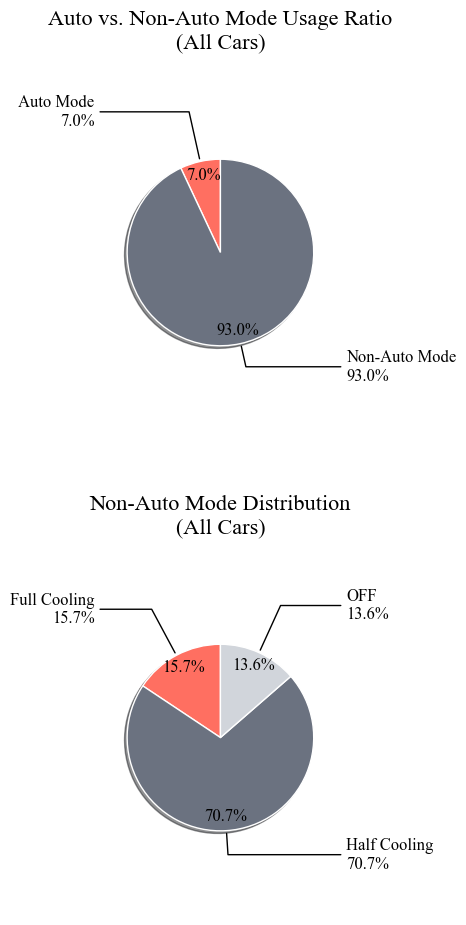

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Try to import seaborn and set style for consistency, with a fallback
try:
    import seaborn as sns
    sns.set_style('white')  # Use Seaborn's white style for a clean background
    print("Seaborn style 'white' applied successfully.")
except ImportError:
    print("Seaborn not installed. Using default Matplotlib style with custom settings.")
    plt.style.use('default')  # Fallback to default Matplotlib style
except ValueError as e:
    print(f"Error applying Seaborn style: {e}. Using default Matplotlib style with custom settings.")
    plt.style.use('default')

# Apply paper-style settings for publication
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'Times New Roman',  # Preferred serif font for academic papers
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'legend.title_fontsize': 14,
    'figure.figsize': (5, 10),  # Adjusted for two vertically stacked pie charts
    'axes.grid': False,  # No grid for pie charts
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.spines.left': False,
    'axes.spines.bottom': False,
})

def plot_auto_non_auto_and_operating_modes(car_dfs):
    # Prepare data for all cars combined (no month filter)
    combined_df = pd.concat([car_df for car_df in car_dfs.values()], ignore_index=True)
    
    if combined_df.empty:
        print("No data available across all cars")
        return
    
    # --- Auto vs. Non-Auto Mode Ratio ---
    # Calculate Auto mode ratio
    auto_ratio = combined_df['HVAC SDR_T CAR 자동 AUTO'].mean() * 100
    non_auto_ratio = 100 - auto_ratio
    
    # Prepare data for the first pie chart (Auto vs. Non-Auto)
    labels_auto = [f'Auto Mode\n{auto_ratio:.1f}%', f'Non-Auto Mode\n{non_auto_ratio:.1f}%']
    sizes_auto = [auto_ratio, non_auto_ratio]
    colors_auto = ['#FF6F61', '#6B7280']  # Red for Auto, Gray for Non-Auto
    
    # --- Operating Mode Distribution for Non-Auto Mode ---
    # Filter for Non-Auto mode
    non_auto_df = combined_df[combined_df['HVAC SDR_T CAR 자동 AUTO'] == 0].copy()
    
    if non_auto_df.empty:
        print("No non-Auto data across all cars")
        return
    
    # Calculate counts for each mode
    full_cool_count = non_auto_df['HVAC SD_전냉 CFULL'].sum()
    half_cool_count = non_auto_df['HVAC SD_반냉 CHALF'].sum()
    off_count = non_auto_df['HVAC SD_OFF'].sum()
    
    # Calculate total and percentages
    total_count = full_cool_count + half_cool_count + off_count
    if total_count == 0:
        print("No valid mode data for non-Auto mode")
        return
    
    full_cool_ratio = (full_cool_count / total_count) * 100
    half_cool_ratio = (half_cool_count / total_count) * 100
    off_ratio = (off_count / total_count) * 100
    
    # Prepare data for the second pie chart (Operating Modes)
    labels_modes = [f'Full Cooling\n{full_cool_ratio:.1f}%', 
                    f'Half Cooling\n{half_cool_ratio:.1f}%', 
                    f'OFF\n{off_ratio:.1f}%']
    sizes_modes = [full_cool_ratio, half_cool_ratio, off_ratio]
    colors_modes = ['#FF6F61', '#6B7280', '#D1D5DB']  # Red for Full, Gray for Half, Light Gray for OFF
    
    # Create a figure with two subplots (vertically stacked)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5, 10))
    
    # --- Plot Auto vs. Non-Auto Mode Pie Chart ---
    wedges1, texts1, autotexts1 = ax1.pie(
        sizes_auto, colors=colors_auto, startangle=90, shadow=True, 
        wedgeprops={'edgecolor': 'white', 'linewidth': 1},
        autopct='%1.1f%%', pctdistance=0.85,  # Position of percentage labels
        textprops={'fontsize': 12, 'fontfamily': 'Times New Roman'}
    )
    
    # Place labels outside with lines connecting to slices (one label per category)
    for i, (wedge, txt) in enumerate(zip(wedges1, texts1)):
        ang = (wedge.theta2 - wedge.theta1) / 2. + wedge.theta1
        y = np.sin(np.deg2rad(ang))
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = f"angle,angleA=0,angleB={ang}"
        txt.set_visible(False)  # Hide the default label
        ax1.annotate(labels_auto[i], xy=(x, y), xytext=(1.35 * np.sign(x), 1.4 * y),
                     horizontalalignment=horizontalalignment, 
                     fontsize=12, fontfamily='Times New Roman',
                     arrowprops=dict(arrowstyle="-", connectionstyle=connectionstyle))
    
    ax1.axis('equal')  # Equal aspect ratio ensures the pie chart is a circle
    ax1.set_title('Auto vs. Non-Auto Mode Usage Ratio\n(All Cars)', pad=20, fontfamily='Times New Roman')
    
    # --- Plot Operating Mode Distribution Pie Chart ---
    wedges2, texts2, autotexts2 = ax2.pie(
        sizes_modes, colors=colors_modes, startangle=90, shadow=True, 
        wedgeprops={'edgecolor': 'white', 'linewidth': 1},
        autopct='%1.1f%%', pctdistance=0.85,  # Position of percentage labels
        textprops={'fontsize': 12, 'fontfamily': 'Times New Roman'}
    )
    
    # Place labels outside with lines connecting to slices (one label per category)
    for i, (wedge, txt) in enumerate(zip(wedges2, texts2)):
        ang = (wedge.theta2 - wedge.theta1) / 2. + wedge.theta1
        y = np.sin(np.deg2rad(ang))
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = f"angle,angleA=0,angleB={ang}"
        txt.set_visible(False)  # Hide the default label
        ax2.annotate(labels_modes[i], xy=(x, y), xytext=(1.35 * np.sign(x), 1.4 * y),
                     horizontalalignment=horizontalalignment, 
                     fontsize=12, fontfamily='Times New Roman',
                     arrowprops=dict(arrowstyle="-", connectionstyle=connectionstyle))
    
    ax2.axis('equal')  # Equal aspect ratio ensures the pie chart is a circle
    ax2.set_title('Non-Auto Mode Distribution\n(All Cars)', pad=20, fontfamily='Times New Roman')
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

# Example usage:
# car_dfs = {'1호차': df1, '2호차': df2, ..., '10호차': df10}
plot_auto_non_auto_and_operating_modes(car_dfs)

In [ ]:

# Plotting function (unchanged)
def plot_journal_bw(stats_df, month_name, filename):
    if stats_df.empty:
        print(f"No data to plot for {month_name}")
        return
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6), dpi=300)
    x = np.arange(len(stats_df))
    x_labels = [str(i) for i in range(1, len(stats_df) + 1)]

    # 1. Indoor temperature bar plot
    ax1.bar(x, stats_df['평균 실내온도'], width=0.5, color='gray', edgecolor='black', linewidth=0.5)
    ax1.set_title(f'{month_name} Average Indoor Temperature', fontsize=12, pad=10)
    ax1.set_xlabel('Car Number', fontsize=10)
    ax1.set_ylabel('Temperature (°C)', fontsize=10)
    ax1.set_xticks(x)
    ax1.set_xticklabels(x_labels, rotation=0, ha='center', fontsize=10)
    ax1.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
    for i, v in enumerate(stats_df['평균 실내온도']):
        ax1.text(i, v + 0.5, f'{v:.1f}', ha='center', va='bottom', fontsize=8)

    # 2. Grouped bar plot for non-Auto HVAC ratios
    width = 0.2
    ax2.bar(x - width, stats_df['전냉방 비율 (Non-Auto)'], width, color='#D3D3D3', edgecolor='black', label='Full Cooling')
    ax2.bar(x, stats_df['반냉방 비율 (Non-Auto)'], width, color='#808080', edgecolor='black', label='Half Cooling')
    ax2.bar(x + width, stats_df['Off 비율 (Non-Auto)'], width, color='#404040', edgecolor='black', label='Off')
    ax2.set_title(f'{month_name} Non-Auto HVAC Operation Ratios', fontsize=12, pad=10)
    ax2.set_xlabel('Car Number', fontsize=10)
    ax2.set_ylabel('Ratio (%)', fontsize=10)
    ax2.set_xticks(x)
    ax2.set_xticklabels(x_labels, rotation=0, ha='center', fontsize=10)
    ax2.legend(frameon=False, fontsize=10, loc='upper right')
    ax2.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight', format='png', facecolor='white', edgecolor='none')
    plt.show()

# Assuming car_dfs is defined
stats_july = calculate_stats(car_dfs, 7)
stats_august = calculate_stats(car_dfs, 8)

# Generate plots
plot_journal_bw(stats_july, 'July', 'july_stats_bw.png')
plot_journal_bw(stats_august, 'August', 'august_stats_bw.png')

# Print tables
print("\nJuly 2025 Statistics:")
print(stats_july if not stats_july.empty else "No data available for July 2025")

print("\nAugust 2025 Statistics:")
print(stats_august if not stats_august.empty else "No data available for August 2025")

In [8]:
print("\nJuly 2024 Statistics:")
print(stats_july)



July 2024 Statistics:
      평균 실내온도  최소 실내온도  최대 실내온도  중앙값 실내온도  평균 실외온도  최소 실외온도  최대 실외온도  \
1호차      22.4     19.0     26.0      22.0     22.4     26.0     41.0   
2호차      21.5     18.0     25.0      21.0     21.5      0.0      0.0   
3호차      21.5     18.0     25.0      21.0     21.5      0.0      0.0   
4호차      21.4     18.0     25.0      21.0     21.4      0.0      0.0   
5호차      21.6     18.0     27.0      21.0     21.6      0.0      0.0   
6호차      21.0     18.0     24.0      21.0     21.0      0.0      0.0   
7호차      20.9     18.0     25.0      21.0     20.9      0.0      0.0   
8호차      20.8     17.0     24.0      21.0     20.8      0.0      0.0   
9호차      20.9     18.0     24.0      21.0     20.9      0.0      0.0   
10호차     21.6     18.0     25.0      22.0     21.6     26.0     41.0   

      중앙값 실외온도  20-23°C 비율  Auto 비율  전냉방 비율 (Non-Auto)  반냉방 비율 (Non-Auto)  \
1호차       31.0        53.5      6.2               30.6               66.0   
2호차        0.0        76.9    

In [9]:
# Print tables (now including Auto 비율)
print("\nAugust 2024 Statistics:")
print(stats_august)


August 2024 Statistics:
      평균 실내온도  최소 실내온도  최대 실내온도  중앙값 실내온도  평균 실외온도  최소 실외온도  최대 실외온도  \
1호차      22.7     18.0     26.0      23.0     22.7     28.0     44.0   
2호차      21.5     18.0     24.0      22.0     21.5      0.0      0.0   
3호차      21.4     19.0     25.0      21.0     21.4      0.0      0.0   
4호차      21.2     18.0     25.0      21.0     21.2      0.0      0.0   
5호차      21.2     18.0     25.0      21.0     21.2      0.0      0.0   
6호차      20.9     18.0     24.0      21.0     20.9      0.0      0.0   
7호차      20.8     17.0     24.0      21.0     20.8      0.0      0.0   
8호차      20.8     17.0     24.0      21.0     20.8      0.0      0.0   
9호차      21.0     18.0     24.0      21.0     21.0      0.0      0.0   
10호차     21.8     18.0     25.0      22.0     21.8     28.0     46.0   

      중앙값 실외온도  20-23°C 비율  Auto 비율  전냉방 비율 (Non-Auto)  반냉방 비율 (Non-Auto)  \
1호차       34.0        39.3      2.0               35.4               62.1   
2호차        0.0        85.6  

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_temperature_distribution_subset(car_dfs, month, cars):
    sns.set_theme(style="white")
    plt.rcParams.update({
        'font.family': 'serif',
        'axes.titlesize': 12,
        'axes.labelsize': 11,
        'xtick.labelsize': 10,
        'ytick.labelsize': 10
    })

    n = len(cars)
    rows = (n + 2) // 3  # 2~3줄
    fig, axes = plt.subplots(rows, 3, figsize=(15, 4 * rows), sharex=True, sharey=True)
    axes = axes.flatten()

    for idx, car_name in enumerate(cars):
        ax = axes[idx]
        if car_name in car_dfs:
            df = car_dfs[car_name]
            df['발생시각'] = pd.to_datetime(df['발생시각'])
            month_df = df[df['발생시각'].dt.month == month]

            if not month_df.empty:
                sns.kdeplot(month_df['HVAC SD_실내온도 값'], 
                            fill=True, ax=ax, color='black', linewidth=1)
                ax.set_title(car_name)
            else:
                ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes)
        ax.set_xlabel('')
        ax.set_ylabel('')

    # 라벨 추가
    fig.text(0.5, 0.04, '실내온도 (°C)', ha='center', fontsize=12)
    fig.text(0.06, 0.5, '밀도', va='center', rotation='vertical', fontsize=12)
    plt.tight_layout(rect=[0.05, 0.05, 1, 1])
    plt.show()



/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1789/2879018992.py:61: UserWarning: Glyph 54840 (\N{HANGUL SYLLABLE HO}) missing from font(s) DejaVu Serif.
  plt.tight_layout(rect=[0.05, 0.05, 1, 1])
/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1789/2879018992.py:61: UserWarning: Glyph 52264 (\N{HANGUL SYLLABLE CA}) missing from font(s) DejaVu Serif.
  plt.tight_layout(rect=[0.05, 0.05, 1, 1])
/Users/dongbae/Dev/.conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) DejaVu Serif.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/dongbae/Dev/.conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 45236 (\N{HANGUL SYLLABLE NAE}) missing from font(s) DejaVu Serif.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/dongbae/Dev/.conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 50728 (\N{HANGUL SYLLABLE ON}) missing fro

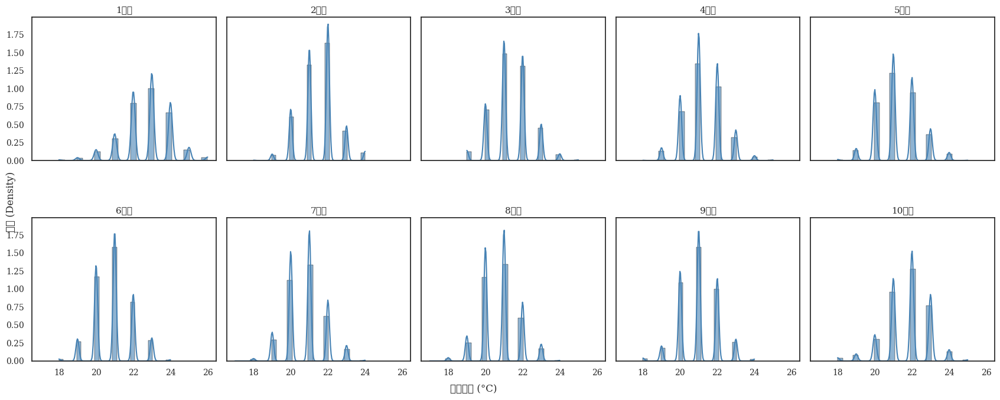

In [31]:
plot_temperature_distribution(car_dfs, 8)

Seaborn style 'whitegrid' applied successfully.


/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1271/1992397830.py:101: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mode_counts = non_auto_with_temp.groupby('Temp Range').agg({
/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1271/1992397830.py:117: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  temp_by_range = non_auto_with_temp.groupby('Temp Range')['Avg Outdoor Temp'].apply(list)
/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1271/1992397830.py:121: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass ob

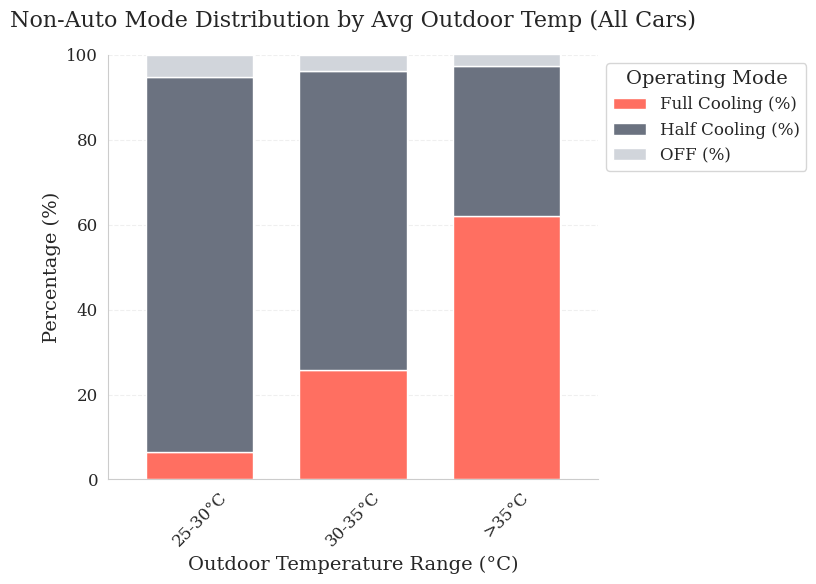

/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1271/1992397830.py:156: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(temp_values, labels=temp_ranges, patch_artist=True,


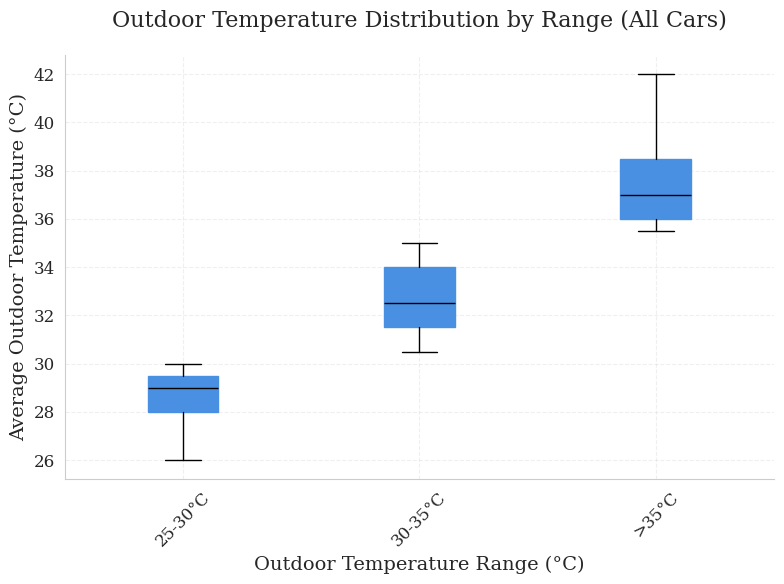

/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1271/1992397830.py:177: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax3.boxplot(indoor_temp_values, labels=temp_ranges, patch_artist=True,


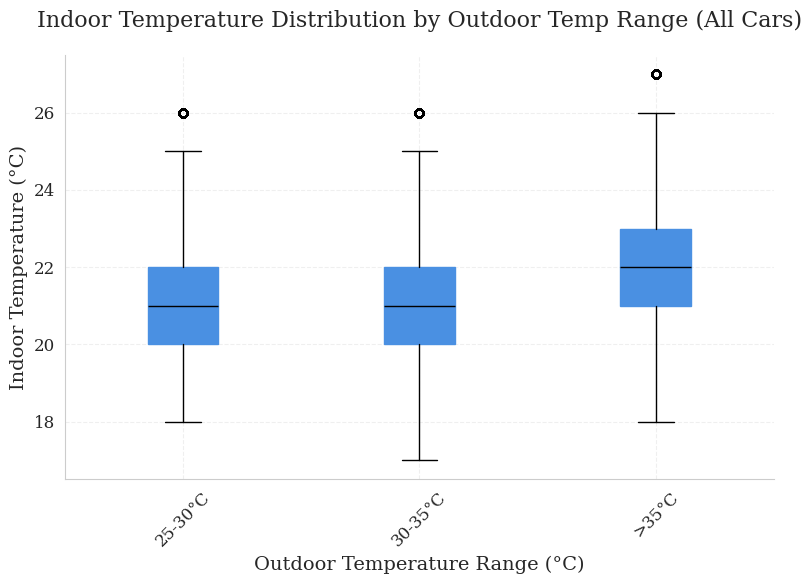

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Try to import seaborn and set style, with a fallback if seaborn is not available
try:
    import seaborn as sns
    sns.set_style('whitegrid')  # Use Seaborn's whitegrid style
    print("Seaborn style 'whitegrid' applied successfully.")
except ImportError:
    
    print("Seaborn not installed. Using default Matplotlib style with custom settings.")
    plt.style.use('default')  # Fallback to default Matplotlib style
except ValueError as e:
    print(f"Error applying Seaborn style: {e}. Using default Matplotlib style with custom settings.")
    plt.style.use('default')

# Apply paper-style settings
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'legend.title_fontsize': 14,
    'figure.figsize': (8, 6),
    'axes.grid': True,
    'grid.linestyle': '--',
    'grid.alpha': 0.3,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

def plot_non_auto_mode_distribution_by_avg_outdoor_temp(car_dfs):
    # Define outdoor temperature bins
    temp_bins = [25, 30, 35, 50]  # Adjustable bins
    temp_labels = ['25-30°C', '30-35°C', '>35°C']
    
    # Filter Car 1 and Car 10 for outdoor temperature
    car_1_df = car_dfs.get('1호차')
    car_10_df = car_dfs.get('10호차')
    
    if car_1_df is None or car_10_df is None:
        print("Error: Car_1 or Car_10 data not found. Expected keys: '1호차', '10호차'")
        return
    
    # Use the entire dataset (no month filter)
    car_1_df = car_1_df.copy()
    car_10_df = car_10_df.copy()
    
    if car_1_df.empty or car_10_df.empty:
        print("No data for Car_1 or Car_10")
        return
    
    # Merge Car 1 and Car 10 on timestamp to calculate average outdoor temperature
    merged_temp_df = pd.merge(
        car_1_df[['발생시각', 'HVAC SD_실외온도 값']],
        car_10_df[['발생시각', 'HVAC SD_실외온도 값']],
        on='발생시각',
        suffixes=('_car1', '_car10')
    )
    
    # Calculate average outdoor temperature
    merged_temp_df['Avg Outdoor Temp'] = (
        merged_temp_df['HVAC SD_실외온도 값_car1'] + merged_temp_df['HVAC SD_실외온도 값_car10']
    ) / 2
    
    # Bin the average outdoor temperatures
    merged_temp_df['Temp Range'] = pd.cut(
        merged_temp_df['Avg Outdoor Temp'],
        bins=temp_bins,
        labels=temp_labels,
        include_lowest=True
    )
    
    # Prepare data for all cars combined
    combined_df = pd.concat([car_df for car_df in car_dfs.values()], ignore_index=True)
    
    # Filter for non-Auto mode (no month filter)
    non_auto_df = combined_df[combined_df['HVAC SDR_T CAR 자동 AUTO'] == 0].copy()
    
    if non_auto_df.empty:
        print("No non-Auto data across all cars")
        return
    
    # Merge with averaged temperature data and include indoor temperature
    non_auto_with_temp = pd.merge(
        non_auto_df[['발생시각', 'HVAC SD_전냉 CFULL', 'HVAC SD_반냉 CHALF', 'HVAC SD_OFF', 'HVAC SD_실내온도 값']],
        merged_temp_df[['발생시각', 'Temp Range', 'Avg Outdoor Temp']],
        on='발생시각',
        how='inner'
    )
    
    if non_auto_with_temp.empty:
        print("No matching temperature data across all cars")
        return
    
    # --- Operating Mode Distribution ---
    # Calculate counts for each mode per temperature range
    mode_counts = non_auto_with_temp.groupby('Temp Range').agg({
        'HVAC SD_전냉 CFULL': 'sum',
        'HVAC SD_반냉 CHALF': 'sum',
        'HVAC SD_OFF': 'sum'
    }).fillna(0)
    
    # Calculate percentages
    mode_counts['Total'] = mode_counts.sum(axis=1)
    mode_counts['Full Cooling (%)'] = (mode_counts['HVAC SD_전냉 CFULL'] / mode_counts['Total'] * 100).round(1)
    mode_counts['Half Cooling (%)'] = (mode_counts['HVAC SD_반냉 CHALF'] / mode_counts['Total'] * 100).round(1)
    mode_counts['OFF (%)'] = (mode_counts['HVAC SD_OFF'] / mode_counts['Total'] * 100).round(1)
    
    mode_percentages = mode_counts[['Full Cooling (%)', 'Half Cooling (%)', 'OFF (%)']]
    
    # --- Outdoor Temperature Distribution ---
    # Group by temperature range for outdoor temperature distribution
    temp_by_range = non_auto_with_temp.groupby('Temp Range')['Avg Outdoor Temp'].apply(list)
    
    # --- Indoor Temperature Distribution by Outdoor Temperature Range ---
    # Group by temperature range for indoor temperature distribution
    indoor_temp_by_range = non_auto_with_temp.groupby('Temp Range')['HVAC SD_실내온도 값'].apply(list)
    
    # --- Plot Operating Mode Distribution ---
    fig1, ax1 = plt.subplots()
    
    mode_percentages.plot(
        kind='bar',
        stacked=True,
        ax=ax1,
        color=['#FF6F61', '#6B7280', '#D1D5DB'],  # Consistent colors
        width=0.7  # Slightly narrower bars for a cleaner look
    )
    
    # Customize plot
    ax1.set_title('Non-Auto Mode Distribution by Avg Outdoor Temp (All Cars)', pad=20)
    ax1.set_xlabel('Outdoor Temperature Range (°C)')
    ax1.set_ylabel('Percentage (%)')
    ax1.set_ylim(0, 100)  # Ensure y-axis goes from 0 to 100
    ax1.tick_params(axis='x', rotation=45)
    
    # Adjust legend
    ax1.legend(title='Operating Mode', loc='upper left', bbox_to_anchor=(1, 1))
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()
    
    # --- Plot Outdoor Temperature Distribution ---
    fig2, ax2 = plt.subplots()
    
    # Prepare data for boxplot
    temp_ranges = temp_labels
    temp_values = [temp_by_range.get(temp_range, []) for temp_range in temp_ranges]
    
    # Plot boxplot
    ax2.boxplot(temp_values, labels=temp_ranges, patch_artist=True, 
                boxprops=dict(facecolor='#4A90E2', color='#4A90E2'),
                medianprops=dict(color='black'))
    
    # Customize plot
    ax2.set_title('Outdoor Temperature Distribution by Range (All Cars)', pad=20)
    ax2.set_xlabel('Outdoor Temperature Range (°C)')
    ax2.set_ylabel('Average Outdoor Temperature (°C)')
    ax2.tick_params(axis='x', rotation=45)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()
    
    # --- Plot Indoor Temperature Distribution by Outdoor Temperature Range ---
    fig3, ax3 = plt.subplots()
    
    # Prepare data for boxplot
    indoor_temp_values = [indoor_temp_by_range.get(temp_range, []) for temp_range in temp_ranges]
    
    # Plot boxplot
    ax3.boxplot(indoor_temp_values, labels=temp_ranges, patch_artist=True, 
                boxprops=dict(facecolor='#4A90E2', color='#4A90E2'),
                medianprops=dict(color='black'))
    
    # Customize plot
    ax3.set_title('Indoor Temperature Distribution by Outdoor Temp Range (All Cars)', pad=20)
    ax3.set_xlabel('Outdoor Temperature Range (°C)')
    ax3.set_ylabel('Indoor Temperature (°C)')
    ax3.tick_params(axis='x', rotation=45)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage:
# car_dfs = {'1호차': df1, '2호차': df2, ..., '10호차': df10}
plot_non_auto_mode_distribution_by_avg_outdoor_temp(car_dfs)

Seaborn style 'whitegrid' applied successfully.


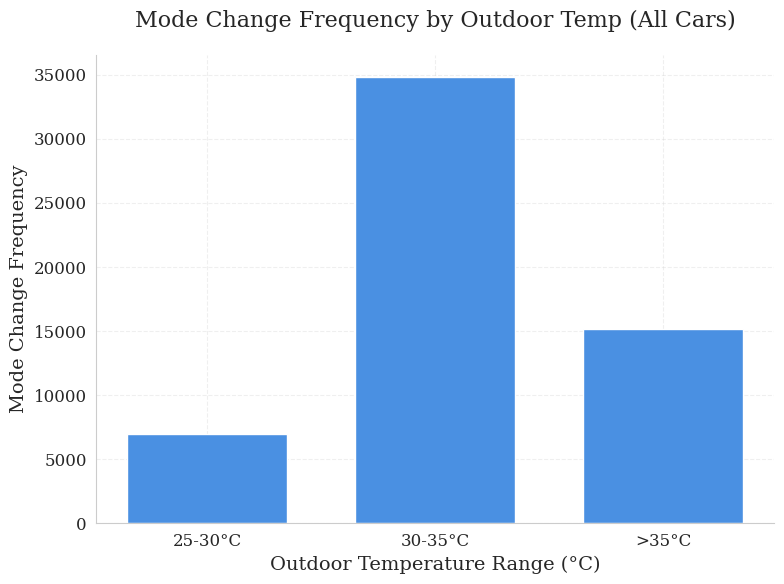

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Try to import seaborn and set style, with a fallback if seaborn is not available
try:
    import seaborn as sns
    sns.set_style('whitegrid')  # Use Seaborn's whitegrid style
    print("Seaborn style 'whitegrid' applied successfully.")
except ImportError:
    print("Seaborn not installed. Using default Matplotlib style with custom settings.")
    plt.style.use('default')  # Fallback to default Matplotlib style
except ValueError as e:
    print(f"Error applying Seaborn style: {e}. Using default Matplotlib style with custom settings.")
    plt.style.use('default')

# Apply paper-style settings
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'legend.title_fontsize': 14,
    'figure.figsize': (8, 6),
    'axes.grid': True,
    'grid.linestyle': '--',
    'grid.alpha': 0.3,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

def plot_mode_change_frequency_by_outdoor_temp(car_dfs):
    # Define outdoor temperature bins
    temp_bins = [25, 30, 35, 50]  # Adjustable bins
    temp_labels = ['25-30°C', '30-35°C', '>35°C']
    
    # Filter Car 1 and Car 10 for outdoor temperature
    car_1_df = car_dfs.get('1호차')
    car_10_df = car_dfs.get('10호차')
    
    if car_1_df is None or car_10_df is None:
        print("Error: Car_1 or Car_10 data not found. Expected keys: '1호차', '10호차'")
        return
    
    # Use the entire dataset (no month filter)
    car_1_df = car_1_df.copy()
    car_10_df = car_10_df.copy()
    
    if car_1_df.empty or car_10_df.empty:
        print("No data for Car_1 or Car_10")
        return
    
    # Merge Car 1 and Car 10 on timestamp to calculate average outdoor temperature
    merged_temp_df = pd.merge(
        car_1_df[['발생시각', 'HVAC SD_실외온도 값']],
        car_10_df[['발생시각', 'HVAC SD_실외온도 값']],
        on='발생시각',
        suffixes=('_car1', '_car10')
    )
    
    # Calculate average outdoor temperature
    merged_temp_df['Avg Outdoor Temp'] = (
        merged_temp_df['HVAC SD_실외온도 값_car1'] + merged_temp_df['HVAC SD_실외온도 값_car10']
    ) / 2
    
    # Bin the average outdoor temperatures
    merged_temp_df['Temp Range'] = pd.cut(
        merged_temp_df['Avg Outdoor Temp'],
        bins=temp_bins,
        labels=temp_labels,
        include_lowest=True
    )
    
    # Prepare data for all cars combined
    combined_df = pd.concat([car_df for car_df in car_dfs.values()], ignore_index=True)
    
    # Filter for non-Auto mode (no month filter)
    non_auto_df = combined_df[combined_df['HVAC SDR_T CAR 자동 AUTO'] == 0].copy()
    
    if non_auto_df.empty:
        print("No non-Auto data across all cars")
        return
    
    # Merge with averaged temperature data to assign temperature ranges
    non_auto_with_temp = pd.merge(
        non_auto_df[['발생시각', 'HVAC SD_전냉 CFULL', 'HVAC SD_반냉 CHALF', 'HVAC SD_OFF']],
        merged_temp_df[['발생시각', 'Temp Range']],
        on='발생시각',
        how='inner'
    )
    
    if non_auto_with_temp.empty:
        print("No matching temperature data across all cars")
        return
    
    # Sort by timestamp to ensure chronological order
    non_auto_with_temp = non_auto_with_temp.sort_values('발생시각')
    
    # Determine the mode for each row
    def get_mode(row):
        if row['HVAC SD_전냉 CFULL'] == 1:
            return 'Full Cooling'
        elif row['HVAC SD_반냉 CHALF'] == 1:
            return 'Half Cooling'
        elif row['HVAC SD_OFF'] == 1:
            return 'OFF'
        return None
    
    non_auto_with_temp['Mode'] = non_auto_with_temp.apply(get_mode, axis=1)
    
    # Drop rows where mode couldn't be determined
    non_auto_with_temp = non_auto_with_temp.dropna(subset=['Mode'])
    
    if len(non_auto_with_temp) < 2:
        print("Not enough data to calculate mode changes across all cars")
        return
    
    # Calculate mode changes within each temperature range
    mode_changes = {label: 0 for label in temp_labels}
    previous_mode = non_auto_with_temp['Mode'].iloc[0]
    previous_temp_range = non_auto_with_temp['Temp Range'].iloc[0]
    
    for idx in range(1, len(non_auto_with_temp)):
        current_mode = non_auto_with_temp['Mode'].iloc[idx]
        current_temp_range = non_auto_with_temp['Temp Range'].iloc[idx]
        
        if previous_mode != current_mode:
            # Increment the count for the temperature range where the change occurred
            mode_changes[previous_temp_range] += 1
        
        previous_mode = current_mode
        previous_temp_range = current_temp_range
    
    # Create a single plot
    fig, ax = plt.subplots()
    
    # Plot bar chart
    temp_ranges = list(mode_changes.keys())
    freq_values = list(mode_changes.values())
    ax.bar(temp_ranges, freq_values, color='#4A90E2', width=0.7)
    
    # Customize plot
    ax.set_title('Mode Change Frequency by Outdoor Temp (All Cars)', pad=20)
    ax.set_xlabel('Outdoor Temperature Range (°C)')
    ax.set_ylabel('Mode Change Frequency')
    ax.tick_params(axis='x', rotation=0)
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

# Example usage:
# car_dfs = {'1호차': df1, '2호차': df2, ..., '10호차': df10}
plot_mode_change_frequency_by_outdoor_temp(car_dfs)

Seaborn style 'whitegrid' applied successfully.


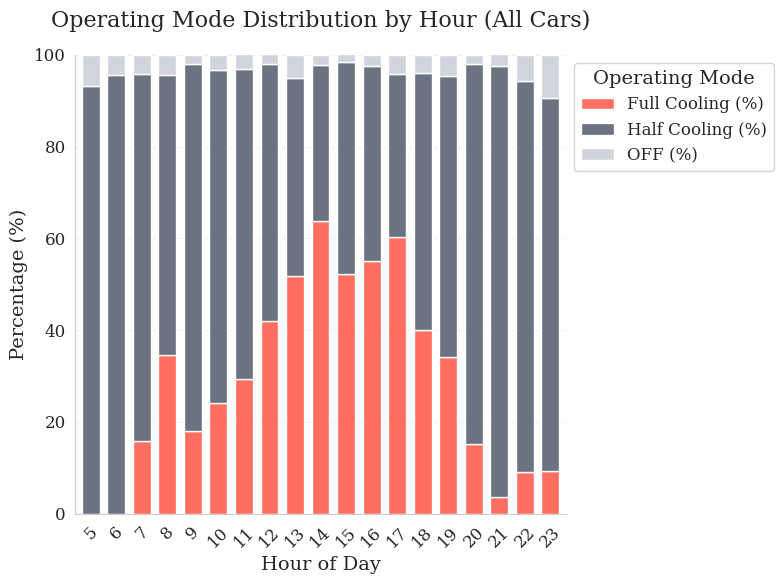

/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1135/2821163089.py:120: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot(temp_values, labels=hours, patch_artist=True,


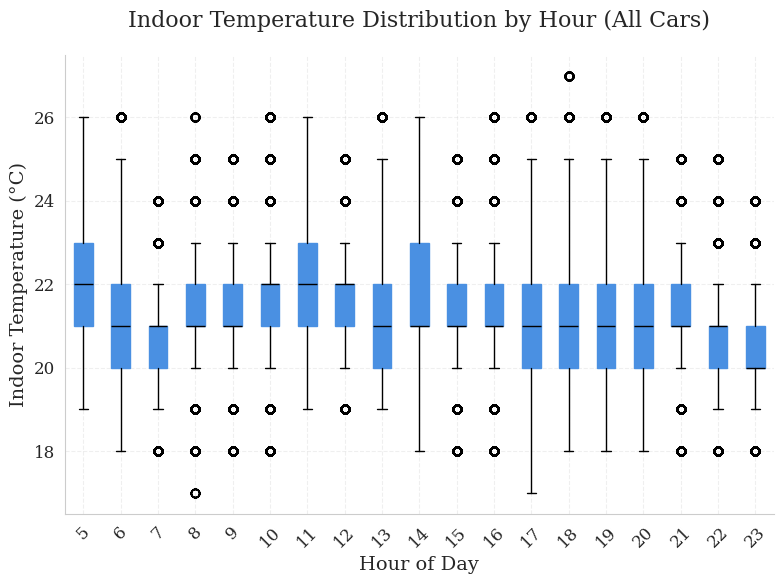

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Try to import seaborn and set style, with a fallback if seaborn is not available
try:
    import seaborn as sns
    sns.set_style('whitegrid')  # Use Seaborn's whitegrid style
    print("Seaborn style 'whitegrid' applied successfully.")
except ImportError:
    print("Seaborn not installed. Using default Matplotlib style with custom settings.")
    plt.style.use('default')  # Fallback to default Matplotlib style
except ValueError as e:
    print(f"Error applying Seaborn style: {e}. Using default Matplotlib style with custom settings.")
    plt.style.use('default')

# Apply paper-style settings
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'legend.title_fontsize': 14,
    'figure.figsize': (8, 6),
    'axes.grid': True,
    'grid.linestyle': '--',
    'grid.alpha': 0.3,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

def plot_mode_and_temperature_distribution_by_hour(car_dfs):
    # Prepare data for all cars combined
    combined_df = pd.concat([car_df for car_df in car_dfs.values()], ignore_index=True)
    
    # Filter for non-Auto mode (no month filter)
    non_auto_df = combined_df[combined_df['HVAC SDR_T CAR 자동 AUTO'] == 0].copy()
    
    if non_auto_df.empty:
        print("No non-Auto data across all cars")
        return
    
    # Extract hour from timestamp
    non_auto_df['Hour'] = non_auto_df['발생시각'].dt.hour
    
    # Determine the mode for each row
    def get_mode(row):
        if row['HVAC SD_전냉 CFULL'] == 1:
            return 'Full Cooling'
        elif row['HVAC SD_반냉 CHALF'] == 1:
            return 'Half Cooling'
        elif row['HVAC SD_OFF'] == 1:
            return 'OFF'
        return None
    
    non_auto_df['Mode'] = non_auto_df.apply(get_mode, axis=1)
    
    # Drop rows where mode couldn't be determined
    non_auto_df = non_auto_df.dropna(subset=['Mode'])
    
    if non_auto_df.empty:
        print("No valid mode data across all cars")
        return
    
    # --- Operating Mode Distribution ---
    # Group by hour and calculate mode counts
    mode_counts = non_auto_df.groupby(['Hour', 'Mode']).size().unstack(fill_value=0)
    
    # Calculate total counts per hour
    mode_counts['Total'] = mode_counts.sum(axis=1)
    
    # Calculate percentages
    for mode in ['Full Cooling', 'Half Cooling', 'OFF']:
        if mode not in mode_counts.columns:
            mode_counts[mode] = 0
        mode_counts[f'{mode} (%)'] = (mode_counts[mode] / mode_counts['Total'] * 100).round(1)
    
    mode_percentages = mode_counts[[f'{mode} (%)' for mode in ['Full Cooling', 'Half Cooling', 'OFF']]]
    
    # --- Indoor Temperature Distribution ---
    # Group by hour for indoor temperature
    temp_by_hour = non_auto_df.groupby('Hour')['HVAC SD_실내온도 값'].apply(list)
    
    # --- Plot Operating Mode Distribution ---
    fig1, ax1 = plt.subplots()
    
    mode_percentages.plot(
        kind='bar',
        stacked=True,
        ax=ax1,
        color=['#FF6F61', '#6B7280', '#D1D5DB'],  # Consistent colors
        width=0.7  # Slightly narrower bars for a cleaner look
    )
    
    # Customize plot
    ax1.set_title('Operating Mode Distribution by Hour (All Cars)', pad=20)
    ax1.set_xlabel('Hour of Day')
    ax1.set_ylabel('Percentage (%)')
    ax1.set_ylim(0, 100)  # Ensure y-axis goes from 0 to 100
    ax1.tick_params(axis='x', rotation=45)
    
    # Adjust legend
    ax1.legend(title='Operating Mode', loc='upper left', bbox_to_anchor=(1, 1))
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()
    
    # --- Plot Indoor Temperature Distribution ---
    fig2, ax2 = plt.subplots()
    
    # Prepare data for boxplot
    hours = sorted(temp_by_hour.index)
    temp_values = [temp_by_hour.get(hour, []) for hour in hours]
    
    # Plot boxplot
    ax2.boxplot(temp_values, labels=hours, patch_artist=True, 
                boxprops=dict(facecolor='#4A90E2', color='#4A90E2'),
                medianprops=dict(color='black'))
    
    # Customize plot
    ax2.set_title('Indoor Temperature Distribution by Hour (All Cars)', pad=20)
    ax2.set_xlabel('Hour of Day')
    ax2.set_ylabel('Indoor Temperature (°C)')
    ax2.tick_params(axis='x', rotation=45)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage:
# car_dfs = {'1호차': df1, '2호차': df2, ..., '10호차': df10}
plot_mode_and_temperature_distribution_by_hour(car_dfs)

Seaborn style 'whitegrid' applied successfully.


/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1135/625807829.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mode_counts = non_auto_df.groupby(['Temp Bin', 'Mode']).size().unstack(fill_value=0)


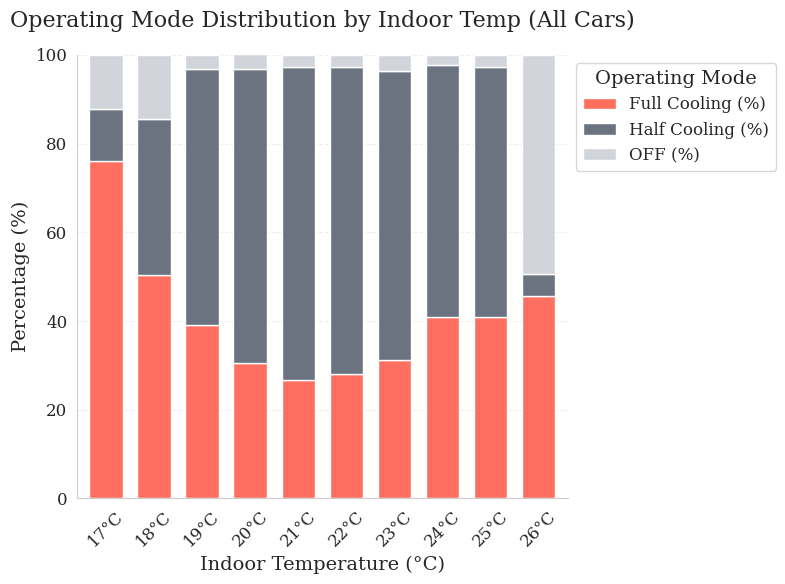

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Try to import seaborn and set style, with a fallback if seaborn is not available
try:
    import seaborn as sns
    sns.set_style('whitegrid')  # Use Seaborn's whitegrid style
    print("Seaborn style 'whitegrid' applied successfully.")
except ImportError:
    print("Seaborn not installed. Using default Matplotlib style with custom settings.")
    plt.style.use('default')  # Fallback to default Matplotlib style
except ValueError as e:
    print(f"Error applying Seaborn style: {e}. Using default Matplotlib style with custom settings.")
    plt.style.use('default')

# Apply paper-style settings
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'legend.title_fontsize': 14,
    'figure.figsize': (8, 6),
    'axes.grid': True,
    'grid.linestyle': '--',
    'grid.alpha': 0.3,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

def plot_mode_distribution_by_indoor_temp(car_dfs):
    # Prepare data for all cars combined
    combined_df = pd.concat([car_df for car_df in car_dfs.values()], ignore_index=True)
    
    # Filter for non-Auto mode (no month filter)
    non_auto_df = combined_df[combined_df['HVAC SDR_T CAR 자동 AUTO'] == 0].copy()
    
    if non_auto_df.empty:
        print("No non-Auto data across all cars")
        return
    
    # Determine the mode for each row
    def get_mode(row):
        if row['HVAC SD_전냉 CFULL'] == 1:
            return 'Full Cooling'
        elif row['HVAC SD_반냉 CHALF'] == 1:
            return 'Half Cooling'
        elif row['HVAC SD_OFF'] == 1:
            return 'OFF'
        return None
    
    non_auto_df['Mode'] = non_auto_df.apply(get_mode, axis=1)
    
    # Drop rows where mode couldn't be determined
    non_auto_df = non_auto_df.dropna(subset=['Mode'])
    
    if non_auto_df.empty:
        print("No valid mode data across all cars")
        return
    
    # Bin indoor temperatures into 1°C intervals
    min_temp = int(non_auto_df['HVAC SD_실내온도 값'].min())
    max_temp = int(non_auto_df['HVAC SD_실내온도 값'].max())
    temp_bins = range(min_temp, max_temp + 1)  # 1°C bins, e.g., 18, 19, 20, ...
    temp_labels = [f"{t}°C" for t in range(min_temp, max_temp)]
    
    if len(temp_bins) < 2:
        print("Not enough indoor temperature range to plot")
        return
    
    non_auto_df['Temp Bin'] = pd.cut(
        non_auto_df['HVAC SD_실내온도 값'],
        bins=temp_bins,
        labels=temp_labels,
        include_lowest=True
    )
    
    # Group by temperature bin and calculate mode counts
    mode_counts = non_auto_df.groupby(['Temp Bin', 'Mode']).size().unstack(fill_value=0)
    
    # Calculate total counts per temperature bin
    mode_counts['Total'] = mode_counts.sum(axis=1)
    
    # Calculate percentages
    for mode in ['Full Cooling', 'Half Cooling', 'OFF']:
        if mode not in mode_counts.columns:
            mode_counts[mode] = 0
        mode_counts[f'{mode} (%)'] = (mode_counts[mode] / mode_counts['Total'] * 100).round(1)
    
    mode_percentages = mode_counts[[f'{mode} (%)' for mode in ['Full Cooling', 'Half Cooling', 'OFF']]]
    
    # Create a single plot
    fig, ax = plt.subplots()
    
    # Plot stacked bar chart
    mode_percentages.plot(
        kind='bar',
        stacked=True,
        ax=ax,
        color=['#FF6F61', '#6B7280', '#D1D5DB'],  # Consistent colors
        width=0.7  # Slightly narrower bars for a cleaner look
    )
    
    # Customize plot
    ax.set_title('Operating Mode Distribution by Indoor Temp (All Cars)', pad=20)
    ax.set_xlabel('Indoor Temperature (°C)')
    ax.set_ylabel('Percentage (%)')
    ax.set_ylim(0, 100)  # Ensure y-axis goes from 0 to 100
    ax.tick_params(axis='x', rotation=45)
    
    # Adjust legend
    ax.legend(title='Operating Mode', loc='upper left', bbox_to_anchor=(1, 1))
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

# Example usage:
# car_dfs = {'1호차': df1, '2호차': df2, ..., '10호차': df10}
plot_mode_distribution_by_indoor_temp(car_dfs)

Seaborn style 'whitegrid' applied successfully.


/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1135/3683449599.py:125: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mode_counts = non_auto_with_temp.groupby(['Temp Bin', 'Mode']).size().unstack(fill_value=0)


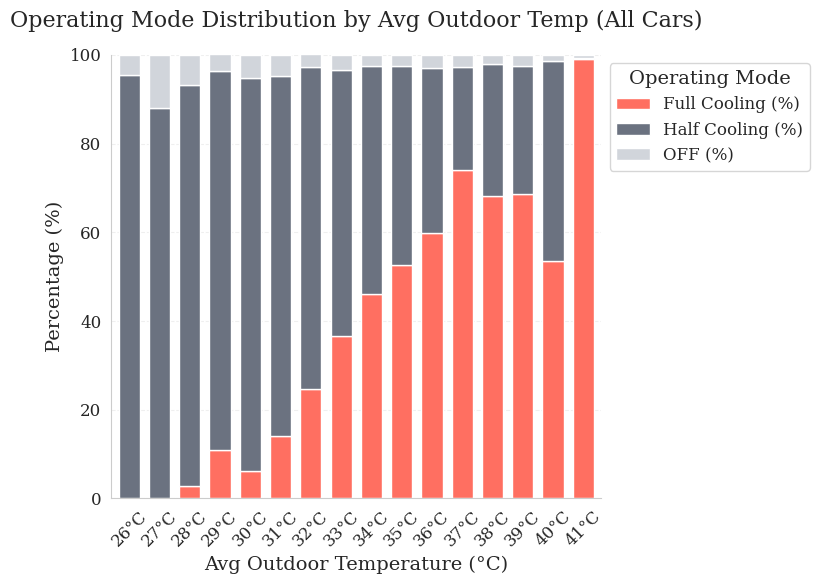

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Try to import seaborn and set style, with a fallback if seaborn is not available
try:
    import seaborn as sns
    sns.set_style('whitegrid')  # Use Seaborn's whitegrid style
    print("Seaborn style 'whitegrid' applied successfully.")
except ImportError:
    print("Seaborn not installed. Using default Matplotlib style with custom settings.")
    plt.style.use('default')  # Fallback to default Matplotlib style
except ValueError as e:
    print(f"Error applying Seaborn style: {e}. Using default Matplotlib style with custom settings.")
    plt.style.use('default')

# Apply paper-style settings
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'legend.title_fontsize': 14,
    'figure.figsize': (8, 6),
    'axes.grid': True,
    'grid.linestyle': '--',
    'grid.alpha': 0.3,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

def plot_mode_distribution_by_outdoor_temp(car_dfs):
    # Filter Car 1 and Car 10 for outdoor temperature
    car_1_df = car_dfs.get('1호차')
    car_10_df = car_dfs.get('10호차')
    
    if car_1_df is None or car_10_df is None:
        print("Error: Car_1 or Car_10 data not found. Expected keys: '1호차', '10호차'")
        return
    
    # Use the entire dataset (no month filter)
    car_1_df = car_1_df.copy()
    car_10_df = car_10_df.copy()
    
    if car_1_df.empty or car_10_df.empty:
        print("No data for Car_1 or Car_10")
        return
    
    # Merge Car 1 and Car 10 on timestamp to calculate average outdoor temperature
    merged_temp_df = pd.merge(
        car_1_df[['발생시각', 'HVAC SD_실외온도 값']],
        car_10_df[['발생시각', 'HVAC SD_실외온도 값']],
        on='발생시각',
        suffixes=('_car1', '_car10')
    )
    
    # Calculate average outdoor temperature
    merged_temp_df['Avg Outdoor Temp'] = (
        merged_temp_df['HVAC SD_실외온도 값_car1'] + merged_temp_df['HVAC SD_실외온도 값_car10']
    ) / 2
    
    # Determine the range for binning
    min_temp = int(merged_temp_df['Avg Outdoor Temp'].min())
    max_temp = int(merged_temp_df['Avg Outdoor Temp'].max())
    temp_bins = range(min_temp, max_temp + 1)  # 1°C bins, e.g., 18, 19, 20, ...
    temp_labels = [f"{t}°C" for t in range(min_temp, max_temp)]
    
    if len(temp_bins) < 2:
        print("Not enough outdoor temperature range to plot")
        return
    
    # Bin the average outdoor temperatures
    merged_temp_df['Temp Bin'] = pd.cut(
        merged_temp_df['Avg Outdoor Temp'],
        bins=temp_bins,
        labels=temp_labels,
        include_lowest=True
    )
    
    # Prepare data for all cars combined
    combined_df = pd.concat([car_df for car_df in car_dfs.values()], ignore_index=True)
    
    # Filter for non-Auto mode (no month filter)
    non_auto_df = combined_df[combined_df['HVAC SDR_T CAR 자동 AUTO'] == 0].copy()
    
    if non_auto_df.empty:
        print("No non-Auto data across all cars")
        return
    
    # Merge with averaged temperature data to assign temperature bins
    non_auto_with_temp = pd.merge(
        non_auto_df[['발생시각', 'HVAC SD_전냉 CFULL', 'HVAC SD_반냉 CHALF', 'HVAC SD_OFF']],
        merged_temp_df[['발생시각', 'Temp Bin']],
        on='발생시각',
        how='inner'
    )
    
    if non_auto_with_temp.empty:
        print("No matching temperature data across all cars")
        return
    
    # Determine the mode for each row
    def get_mode(row):
        if row['HVAC SD_전냉 CFULL'] == 1:
            return 'Full Cooling'
        elif row['HVAC SD_반냉 CHALF'] == 1:
            return 'Half Cooling'
        elif row['HVAC SD_OFF'] == 1:
            return 'OFF'
        return None
    
    non_auto_with_temp['Mode'] = non_auto_with_temp.apply(get_mode, axis=1)
    
    # Drop rows where mode couldn't be determined
    non_auto_with_temp = non_auto_with_temp.dropna(subset=['Mode'])
    
    if non_auto_with_temp.empty:
        print("No valid mode data across all cars")
        return
    
    # Group by temperature bin and calculate mode counts
    mode_counts = non_auto_with_temp.groupby(['Temp Bin', 'Mode']).size().unstack(fill_value=0)
    
    # Calculate total counts per temperature bin
    mode_counts['Total'] = mode_counts.sum(axis=1)
    
    # Calculate percentages
    for mode in ['Full Cooling', 'Half Cooling', 'OFF']:
        if mode not in mode_counts.columns:
            mode_counts[mode] = 0
        mode_counts[f'{mode} (%)'] = (mode_counts[mode] / mode_counts['Total'] * 100).round(1)
    
    mode_percentages = mode_counts[[f'{mode} (%)' for mode in ['Full Cooling', 'Half Cooling', 'OFF']]]
    
    # Create a single plot
    fig, ax = plt.subplots()
    
    # Plot stacked bar chart
    mode_percentages.plot(
        kind='bar',
        stacked=True,
        ax=ax,
        color=['#FF6F61', '#6B7280', '#D1D5DB'],  # Consistent colors
        width=0.7  # Slightly narrower bars for a cleaner look
    )
    
    # Customize plot
    ax.set_title('Operating Mode Distribution by Avg Outdoor Temp (All Cars)', pad=20)
    ax.set_xlabel('Avg Outdoor Temperature (°C)')
    ax.set_ylabel('Percentage (%)')
    ax.set_ylim(0, 100)  # Ensure y-axis goes from 0 to 100
    ax.tick_params(axis='x', rotation=45)
    
    # Adjust legend
    ax.legend(title='Operating Mode', loc='upper left', bbox_to_anchor=(1, 1))
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

# Example usage:
# car_dfs = {'1호차': df1, '2호차': df2, ..., '10호차': df10}
plot_mode_distribution_by_outdoor_temp(car_dfs)

Seaborn style 'whitegrid' applied successfully.


/var/folders/xd/tcjwgm0n2vb52zgqtybk00zm0000gn/T/ipykernel_1135/3078198716.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mode_counts = non_auto_df.groupby(['CO2 Bin', 'Mode']).size().unstack(fill_value=0)


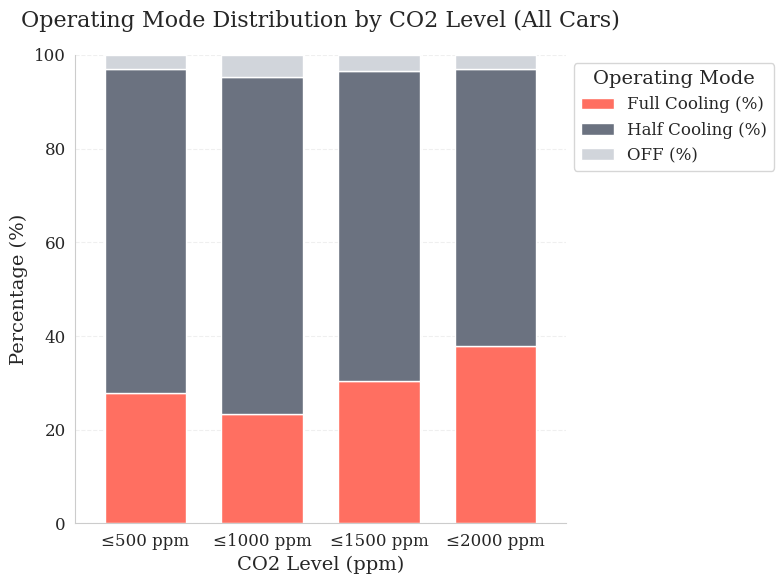

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Try to import seaborn and set style, with a fallback if seaborn is not available
try:
    import seaborn as sns
    sns.set_style('whitegrid')  # Use Seaborn's whitegrid style
    print("Seaborn style 'whitegrid' applied successfully.")
except ImportError:
    print("Seaborn not installed. Using default Matplotlib style with custom settings.")
    plt.style.use('default')  # Fallback to default Matplotlib style
except ValueError as e:
    print(f"Error applying Seaborn style: {e}. Using default Matplotlib style with custom settings.")
    plt.style.use('default')

# Apply paper-style settings (whether seaborn is used or not)
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',  # Use serif font if available (e.g., Times New Roman)
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'legend.title_fontsize': 14,
    'figure.figsize': (8, 6),
    'axes.grid': True,
    'grid.linestyle': '--',
    'grid.alpha': 0.3,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

def plot_mode_distribution_by_co2(car_dfs):
    # Define CO2 bins
    co2_bins = [0, 500, 1000, 1500, 2000]  # ≤500, 500-1000, 1000-1500, 1500-2000 ppm
    co2_labels = ['≤500 ppm', '≤1000 ppm', '≤1500 ppm', '≤2000 ppm']
    
    # Prepare data for all cars combined
    combined_df = pd.concat([car_df for car_df in car_dfs.values()], ignore_index=True)
    
    # Filter for non-Auto mode (no month filter)
    non_auto_df = combined_df[combined_df['HVAC SDR_T CAR 자동 AUTO'] == 0].copy()
    
    if non_auto_df.empty:
        print("No non-Auto data across all cars")
        return
    
    # Check if CO2 column exists
    if 'HVAC SD_CO2 센서 값' not in non_auto_df.columns:
        print("No CO2 data across all cars")
        return
    
    # Bin CO2 levels
    non_auto_df['CO2 Bin'] = pd.cut(
        non_auto_df['HVAC SD_CO2 센서 값'],
        bins=co2_bins,
        labels=co2_labels,
        include_lowest=True
    )
    
    # Determine the mode for each row
    def get_mode(row):
        if row['HVAC SD_전냉 CFULL'] == 1:
            return 'Full Cooling'
        elif row['HVAC SD_반냉 CHALF'] == 1:
            return 'Half Cooling'
        elif row['HVAC SD_OFF'] == 1:
            return 'OFF'
        return None
    
    non_auto_df['Mode'] = non_auto_df.apply(get_mode, axis=1)
    
    # Drop rows where mode or CO2 bin couldn't be determined
    non_auto_df = non_auto_df.dropna(subset=['Mode', 'CO2 Bin'])
    
    if non_auto_df.empty:
        print("No valid mode or CO2 data across all cars")
        return
    
    # Group by CO2 bin and calculate mode counts
    mode_counts = non_auto_df.groupby(['CO2 Bin', 'Mode']).size().unstack(fill_value=0)
    
    # Calculate total counts per CO2 bin
    mode_counts['Total'] = mode_counts.sum(axis=1)
    
    # Calculate percentages
    for mode in ['Full Cooling', 'Half Cooling', 'OFF']:
        if mode not in mode_counts.columns:
            mode_counts[mode] = 0
        mode_counts[f'{mode} (%)'] = (mode_counts[mode] / mode_counts['Total'] * 100).round(1)
    
    mode_percentages = mode_counts[[f'{mode} (%)' for mode in ['Full Cooling', 'Half Cooling', 'OFF']]]
    
    # Create a single plot
    fig, ax = plt.subplots()
    
    # Plot stacked bar chart
    mode_percentages.plot(
        kind='bar',
        stacked=True,
        ax=ax,
        color=['#FF6F61', '#6B7280', '#D1D5DB'],  # Consistent colors
        width=0.7  # Slightly narrower bars for a cleaner look
    )
    
    # Customize plot
    ax.set_title('Operating Mode Distribution by CO2 Level (All Cars)', pad=20)
    ax.set_xlabel('CO2 Level (ppm)')
    ax.set_ylabel('Percentage (%)')
    ax.set_ylim(0, 100)  # Ensure y-axis goes from 0 to 100
    ax.tick_params(axis='x', rotation=0)
    
    # Adjust legend
    ax.legend(title='Operating Mode', loc='upper left', bbox_to_anchor=(1, 1))
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

# Example usage:
# car_dfs = {'Car_1': df1, 'Car_2': df2, ..., 'Car_10': df10}
plot_mode_distribution_by_co2(car_dfs)

In [ ]:
car_df


,발생시각,HCR,TCR,현재역,다음역,종착역,신호장치 속도,Door_Left,Door_Right,HVAC SDR_T CAR 자동 AUTO,...,HVAC SD_FAN,HVAC SD_OFF,HVAC SD_환기동작 VENT,HVAC SD_LF FAN 동작상태 LFF,HVAC SD_실외온도 값,HVAC SD_실내온도 값,HVAC SD_CO2 센서 값,HVAC SD_설정온도 값 HIGH,BECU SD_AS1 압력,BECU SD_AS2 압력
0,2024-07-22 05:20:09,0,1,51,50,166,0,1,0,1,...,0,0,0,0,28,22,398,24.0,3.16,2.92
1,2024-07-22 05:20:10,0,1,51,50,166,0,1,0,1,...,0,0,0,0,28,22,398,24.0,3.16,2.92
2,2024-07-22 05:20:11,0,1,51,50,166,0,1,0,1,...,0,0,0,0,28,22,398,24.0,3.16,2.92
3,2024-07-22 05:20:12,0,1,51,50,166,0,1,0,1,...,0,0,0,0,28,22,398,24.0,3.16,2.92
4,2024-07-22 05:20:13,0,1,51,50,166,0,1,0,1,...,0,0,0,0,28,22,396,24.0,3.16,2.92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
683736,2024-08-18 23:59:54,1,0,20,21,32,36,0,0,0,...,0,0,0,0,35,21,666,25.5,3.16,2.80
683737,2024-08-18 23:59:55,1,0,20,21,32,34,0,0,0,...,0,0,0,0,35,21,663,25.5,3.16,2.84
683738,2024-08-18 23:59:56,1,0,20,21,32,32,0,0,0,...,0,0,0,0,35,21,663,25.5,3.16,2.84
683739,2024-08-18 23:59:57,1,0,20,21,32,29,0,0,0,...,0,0,0,0,35,21,662,25.5,3.20,2.80


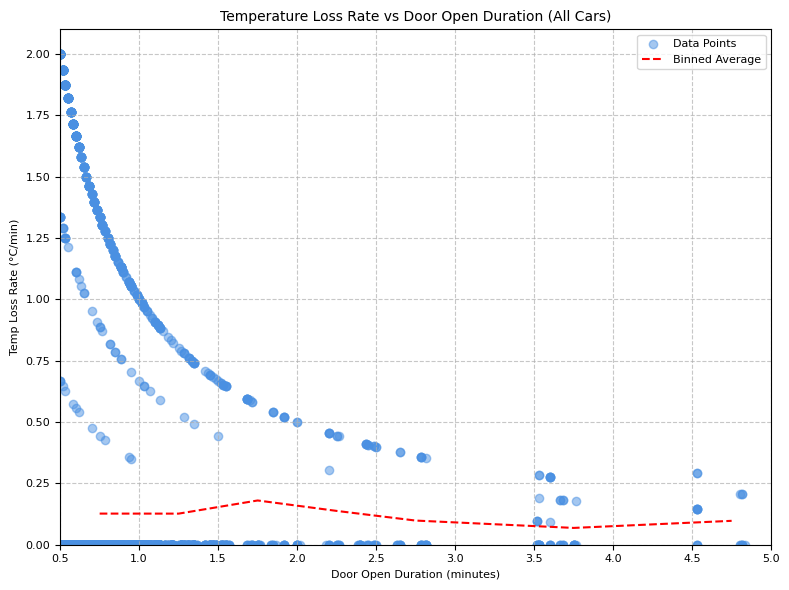

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_temperature_loss_rate_by_door_open_duration(car_dfs):
    # Prepare data for plotting (combine all cars)
    all_durations = []
    all_temp_loss_rates = []
    
    # Process all cars
    for car_name, car_df in car_dfs.items():
        # No month filter, use the entire dataset
        df = car_df.copy()
        
        if df.empty:
            print(f"No data for {car_name}")
            continue
        
        # Check for required columns
        required_cols = ['Door_Left', 'Door_Right', 'HVAC SD_실내온도 값']
        if not all(col in df.columns for col in required_cols):
            print(f"Missing required columns for {car_name}")
            continue
        
        # Sort by timestamp to ensure chronological order
        df = df.sort_values('발생시각')
        
        # Smooth temperature data with a rolling average (window of 3 to reduce noise)
        df['HVAC SD_실내온도 값'] = df['HVAC SD_실내온도 값'].rolling(window=3, center=True, min_periods=1).mean()
        
        # Identify door open state (1 if either Door_Left or Door_Right is 1)
        df['Door_Open'] = (df['Door_Left'] == 1) | (df['Door_Right'] == 1)
        
        # Calculate time difference between consecutive rows (in minutes)
        time_diffs = df['발생시각'].diff().dt.total_seconds() / 60.0  # Convert to minutes
        df['Time_Diff'] = time_diffs.fillna(0)
        
        # Detect door opening events and calculate temperature difference (max - min)
        prev_state = False
        event_temps = []
        start_time = None
        
        for idx in range(len(df)):
            current_state = df['Door_Open'].iloc[idx]
            current_time = df['발생시각'].iloc[idx]
            current_temp = df['HVAC SD_실내온도 값'].iloc[idx]
            
            if current_state and not prev_state:  # Door opens
                start_time = current_time
                event_temps = [current_temp]  # Start collecting temperatures
            elif current_state and prev_state:  # Door remains open
                event_temps.append(current_temp)  # Add temperature to the event
            elif not current_state and prev_state and start_time is not None:  # Door closes
                event_temps.append(current_temp)  # Include the closing temperature
                duration = (current_time - start_time).total_seconds() / 60.0  # Duration in minutes
                if 0.5 <= duration <= 5:  # Only include durations between 0.5 and 5 minutes
                    if event_temps:  # Ensure we have temperature data
                        temp_change = max(event_temps) - min(event_temps)  # Max - Min temperature
                        if duration > 0:  # Avoid division by zero
                            temp_loss_rate = temp_change / duration  # °C per minute
                            if temp_loss_rate <= 5:  # Filter extreme outliers (only positive rates)
                                all_durations.append(duration)
                                all_temp_loss_rates.append(temp_loss_rate)
            
            prev_state = current_state
    
    # Check if there is data to plot
    if not all_durations or not all_temp_loss_rates:
        print("No door opening events (0.5-5 minutes) with valid temperature data across all cars")
        return
    
    # Create a single plot
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Scatter plot
    ax.scatter(all_durations, all_temp_loss_rates, color='#4A90E2', alpha=0.5, label='Data Points')
    
    # Calculate binned averages for trend line
    bin_edges = np.linspace(0.5, 5, 10)  # 10 bins between 0.5 and 5 minutes
    bin_indices = np.digitize(all_durations, bin_edges)
    bin_means = []
    bin_centers = []
    
    for i in range(1, len(bin_edges)):
        mask = bin_indices == i
        if np.any(mask):
            bin_means.append(np.mean([rate for rate, m in zip(all_temp_loss_rates, mask) if m]))
            bin_centers.append((bin_edges[i] + bin_edges[i-1]) / 2)
    
    # Plot trend line (binned averages)
    if bin_means:
        ax.plot(bin_centers, bin_means, color='red', linestyle='--', label='Binned Average')
    
    # Customize plot
    ax.set_title('Temperature Loss Rate vs Door Open Duration (All Cars)', fontsize=10)
    ax.set_xlabel('Door Open Duration (minutes)', fontsize=8)
    ax.set_ylabel('Temp Loss Rate (°C/min)', fontsize=8)
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=8)
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.set_xlim(0.5, 5)  # Set x-axis limit to 0.5-5 minutes
    ax.set_ylim(0, None)  # Set y-axis to start at 0
    ax.legend(fontsize=8)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage:
# car_dfs = {'Car_1': df1, 'Car_2': df2, ..., 'Car_10': df10}
plot_temperature_loss_rate_by_door_open_duration(car_dfs)